In [1]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=RuntimeWarning)
warnings.simplefilter(action='ignore', category=UserWarning)

from datetime import date
import hisepy
import numpy as np
import os
import pandas as pd
import re
import scanpy as sc

In [2]:
out_dir = 'output'
if not os.path.isdir(out_dir):
    os.makedirs(out_dir)

In [3]:
out_files = []
update_list = []

## Helper functions

In [4]:
def cache_uuid_path(uuid):
    cache_path = '/home/jupyter/cache/{u}'.format(u = uuid)
    if not os.path.isdir(cache_path):
        hise_res = hisepy.reader.cache_files([uuid])
    filename = os.listdir(cache_path)[0]
    cache_file = '{p}/{f}'.format(p = cache_path, f = filename)
    return cache_file

In [5]:
def read_csv_uuid(uuid):
    cache_file = cache_uuid_path(uuid)
    res = pd.read_csv(cache_file)
    return res

In [6]:
def read_parquet_uuid(uuid):
    cache_file = cache_uuid_path(uuid)
    res = pd.read_parquet(cache_file)
    return res

In [7]:
def read_adata_uuid(uuid):
    cache_file = cache_uuid_path(uuid)
    res = sc.read_h5ad(cache_file)
    return res

In [8]:
def backed_adata_uuid(uuid):
    cache_file = cache_uuid_path(uuid)
    res = sc.read_h5ad(cache_file, backed = 'r')
    return res

In [9]:
def rm_cache_uuid(uuid):
    cache_path = '/home/jupyter/cache/{u}'.format(u = uuid)
    rm_call = 'rm -r {d}'.format(d = cache_path)
    os.system(rm_call)

In [10]:
def format_cell_type(cell_type):
    cell_type = re.sub('\\+', 'pos', cell_type)
    cell_type = re.sub('-', 'neg', cell_type)
    cell_type = re.sub(' ', '_', cell_type)
    return cell_type

In [11]:
def filename_cell_type(filename):
    cell_type = re.sub('.+L3_','',filename)
    cell_type = re.sub('_2024.+','',cell_type)
    cell_type = re.sub('_', ' ', cell_type)
    cell_type = re.sub('pos','+', cell_type)
    cell_type = re.sub('neg','-', cell_type)
    return cell_type

In [12]:
def add_labels(adata, labels):
    obs = adata.obs
    obs = obs.reset_index(drop = True)
    obs = obs.merge(labels, on = 'barcodes', how = 'left')
    obs = obs.set_index('barcodes', drop = False)
    adata.obs = obs
    return adata

In [13]:
def propagate_hierarchy(
    adata,
    hierarchy_df,
    from_level = 'AIFI_L3',
    to_levels = ['AIFI_L2', 'AIFI_L1'],
    keep_original = True,
    original_prefix = 'predicted_'
):
    obs = adata.obs
    
    for to_level in to_levels:
        prop_df = hierarchy_df[[from_level, to_level]]
        prop_df = prop_df.drop_duplicates()
        
        if keep_original:
            obs = obs.rename({to_level: original_prefix + to_level}, axis = 1)
        else:
            obs = obs.drop(to_level, axis = 1)

        obs[from_level] = obs[from_level].astype(str)
        obs = obs.merge(prop_df, on = from_level, how = 'left')
        obs[from_level] = obs[from_level].astype('category')
        obs[to_level] = obs[to_level].astype('category')
        
    obs = obs.set_index('barcodes', drop = False)
    adata.obs = obs

    return adata

In [14]:
def element_id(n = 3):
    import periodictable
    from random import randrange
    rand_el = []
    for i in range(n):
        el = randrange(0,118)
        rand_el.append(periodictable.elements[el].name)
    rand_str = '-'.join(rand_el)
    return rand_str

## Cluster selection functions

In [15]:
def marker_frac_df(adata, markers, clusters = 'louvain_2'):
    gene_cl_frac = sc.pl.dotplot(
        adata, 
        groupby = clusters,
        var_names = markers,
        return_fig = True
    ).dot_size_df
    return gene_cl_frac

def select_clusters_above_gene_frac(adata, gene, cutoff, clusters = 'louvain_2'):
    gene_cl_frac = marker_frac_df(adata, gene, clusters)
    select_cl = gene_cl_frac.index[gene_cl_frac[gene] > cutoff].tolist()

    return select_cl

def select_clusters_below_gene_frac(adata, gene, cutoff, clusters = 'louvain_2'):
    gene_cl_frac = marker_frac_df(adata, gene, clusters)
    select_cl = gene_cl_frac.index[gene_cl_frac[gene] < cutoff].tolist()

    return select_cl

In [16]:
def extract_cl(adata, gene, direction, cutoff, clusters):
    if direction == 'above':
        sel_cl = select_clusters_above_gene_frac(
            adata, gene, cutoff, clusters
        )
    else:
        sel_cl = select_clusters_below_gene_frac(
            adata, gene, cutoff, clusters
        )
    print(sel_cl)
    sel_idx = adata.obs[clusters].isin(sel_cl)
    n_extracted = sum(sel_idx)
    
    sel_adata = adata[sel_idx]
    
    return sel_adata, n_extracted

In [17]:
def remove_cl(adata, gene, direction, cutoff, clusters):
    if direction == 'above':
        sel_cl = select_clusters_above_gene_frac(
            adata, gene, cutoff, clusters
        )
    else:
        sel_cl = select_clusters_below_gene_frac(
            adata, gene, cutoff, clusters
        )
    print(sel_cl)
    remove_idx = adata.obs[clusters].isin(sel_cl)
    n_removed = sum(remove_idx)
    keep_idx = [not x for x in remove_idx]

    adata = adata[keep_idx]
    
    return adata, n_removed

## Processing function

In [18]:
def process_adata(adata, resolution = 2):
    
    # Keep a copy of the raw data
    adata = adata.raw.to_adata()
    adata.raw = adata

    print('Normalizing', end = "; ")
    # Normalize and log transform
    sc.pp.normalize_total(adata)
    sc.pp.log1p(adata)

    print('Finding HVGs', end = "; ")
    # Restrict downstream steps to variable genes
    sc.pp.highly_variable_genes(adata)
    adata = adata[:, adata.var_names[adata.var['highly_variable']]].copy()

    print('Scaling', end = "; ")
    # Scale variable genes
    sc.pp.scale(adata)

    print('PCA', end = "; ")
    # Run PCA
    sc.tl.pca(adata, svd_solver = 'arpack')
    
    print('Neighbors', end = "; ")
    # Find nearest neighbors
    sc.pp.neighbors(
        adata, 
        n_neighbors = 50,
        n_pcs = 30
    )

    print('Leiden', end = "; ")
    # Find clusters
    sc.tl.leiden(
        adata, 
        resolution = resolution, 
        key_added = 'leiden_{r}'.format(r = resolution),
        n_iterations = 2
    )

    print('UMAP', end = "; ")
    # Run UMAP
    sc.tl.umap(adata, min_dist = 0.05)
    
    print('Renormalizing')
    adata = adata.raw.to_adata()
    adata.raw = adata

    # Normalize and log transform
    sc.pp.normalize_total(adata)
    sc.pp.log1p(adata)
    
    return adata

## Markers for dotplots

In [19]:
broad_markers = [
    'CD3D', # T cells
    'CD3E', # T cells/NK
    'FCN1', # Monocytes/Myeloid
    'HBB', # Erythrocytes
    'MS4A1', # B cells
    'CD79A', # B cells
    'PPBP', # Platelets
    'IFI44L' # ISG-high
]

In [20]:
class_markers = [
    'CD4',
    'CD8A',
    'CD27',
    'GZMB',
    'GZMK',
    'IFI44L',
    'IKZF2',
    'KLRB1',
    'KLRF1',
    'SOX4',
    'TRAC',
    'TRDC',
    'TRDV1',
    'TRDV2'
]

## Read cell type hierarchy

In [21]:
hierarchy_uuid = '1a44252c-8cab-4c8f-92c9-d8f3af633790'
hierarchy_df = read_csv_uuid(hierarchy_uuid)

## Identify files for use in HISE

In [22]:
search_id = 'thallium-americium-moscovium'

Retrieve files stored in our HISE project store

In [23]:
ps_df = hisepy.list_files_in_project_store('cohorts')
ps_df = ps_df[['id', 'name']]

Filter for files from the previous notebook using our search_id

In [24]:
search_df = ps_df[ps_df['name'].str.contains(search_id)]
search_df = search_df.sort_values('name')
search_df['AIFI_L3'] = [filename_cell_type(f) for f in search_df['name']]

In [25]:
search_df['AIFI_L3'].tolist()

['CD4 MAIT',
 'CD8 MAIT',
 'DN T cell',
 'GZMB+ Vd2 gdT',
 'GZMK+ Vd2 gdT',
 'GZMK+ memory CD4 Treg',
 'ISG+ MAIT',
 'KLRB1+ memory CD4 Treg',
 'KLRB1+ memory CD8 Treg',
 'KLRF1- effector Vd1 gdT',
 'KLRF1+ effector Vd1 gdT',
 'Memory CD4 Treg',
 'Memory CD8 Treg',
 'Naive CD4 Treg',
 'Naive Vd1 gdT',
 'Proliferating T cell',
 'SOX4+ Vd1 gdT']

# Updated Filtering

## Filter CD4 MAIT

### Proposed updates

- Remove High doublet score clusters as doublets

In [26]:
cell_type = 'CD4 MAIT'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [27]:
type_uuid

'be3a309f-0ebe-4734-a4b5-51a18d69c2f5'

In [28]:
adata = read_adata_uuid(type_uuid)
total_cells = adata.shape[0]

In [29]:
adata.obs['predicted_AIFI_L3'] = adata.obs['AIFI_L3']

### Clustering

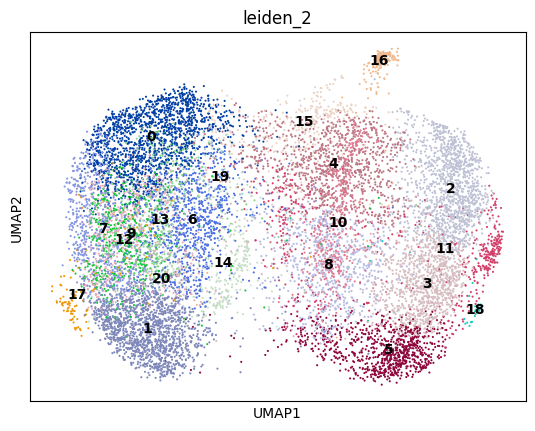

In [30]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

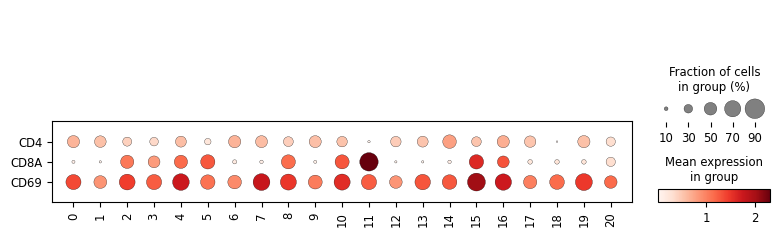

In [31]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = ['CD4','CD8A','CD69'], swap_axes = True)

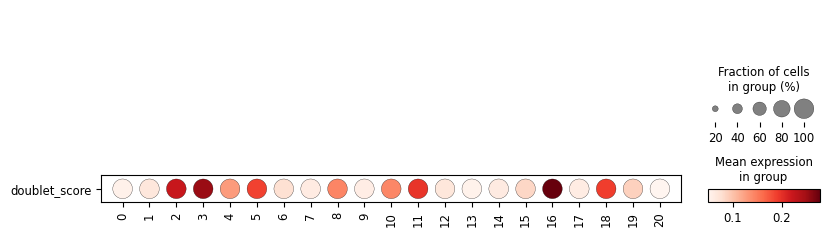

In [32]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = ['doublet_score'], swap_axes = True)

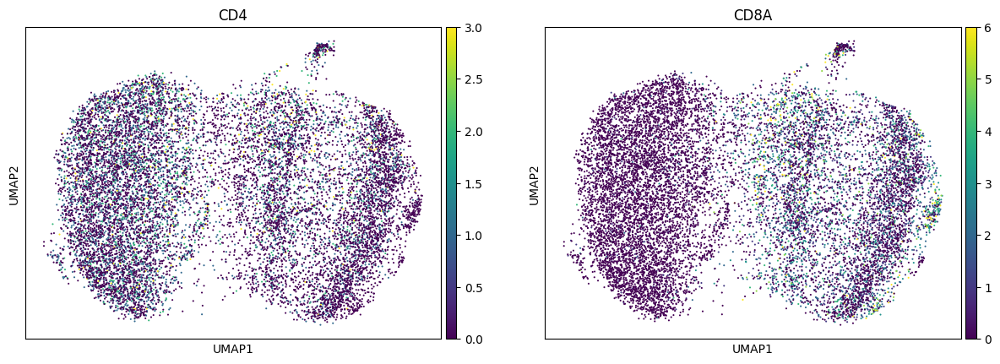

In [33]:
sc.pl.umap(adata, color = ['CD4', 'CD8A'], vmax = 'p99')

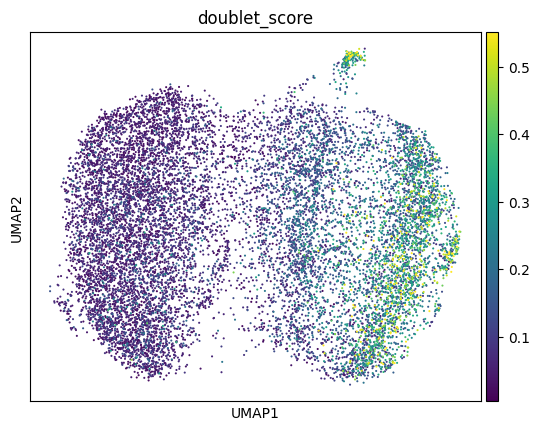

In [34]:
sc.pl.umap(adata, color = ['doublet_score'], vmax = 'p99')

### High doublet score selection

In [35]:
cl_mean_doublet_score = sc.pl.dotplot(
        adata, groupby = 'leiden_2',
        var_names = 'doublet_score',
        return_fig = True
    ).dot_color_df
select_cl = cl_mean_doublet_score.index[cl_mean_doublet_score['doublet_score'] > 0.1].tolist()

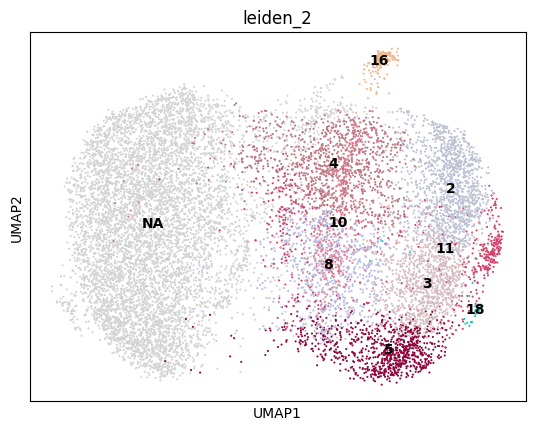

In [36]:
sc.pl.umap(adata, color = 'leiden_2', groups = select_cl, legend_loc = 'on data')

### High doublet score filtering

In [37]:
remove_idx = adata.obs['leiden_2'].isin(select_cl)
n_removed = sum(remove_idx)
keep_idx = [not x for x in remove_idx]
adata = adata[keep_idx]

### High doublet score reason

In [38]:
update_df = pd.DataFrame(
    {'AIFI_L3': [cell_type],
     'update_type': ['reassign'],
     'n_total': [total_cells],
     'n_updated': [n_removed],
     'change_to': ['Doublets']
    }
)
update_list.append(update_df)

### Reprocess filtered cells

In [39]:
adata = process_adata(adata, resolution = 2)
adata = propagate_hierarchy(adata, hierarchy_df)

Normalizing; WARNING: adata.X seems to be already log-transformed.
Finding HVGs; Scaling; PCA; Neighbors; Leiden; UMAP; Renormalizing


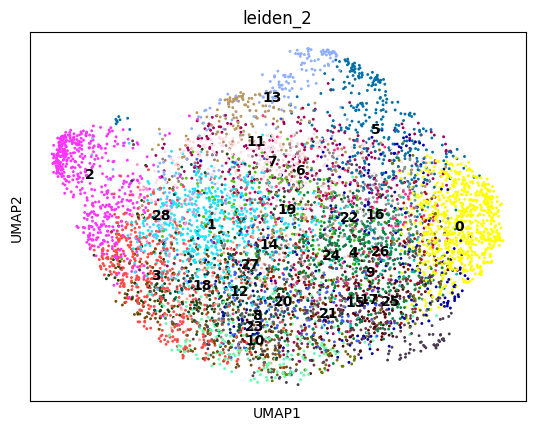

In [40]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Save filtered cells

In [41]:
out_type = format_cell_type(cell_type)
out_file = 'output/diha_filtered_celltypist_L3_{ot}_{d}.h5ad'.format(ot = out_type, d = date.today())
adata.write_h5ad(out_file)
out_files.append(out_file)

## Filter CD8 MAIT

### Proposed updates

- Remove GZMH-high clusters as mislabeled

In [42]:
cell_type = 'CD8 MAIT'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [43]:
type_uuid

'1d6c5e1f-4e1b-4a9c-a104-650512fd27da'

In [44]:
adata = read_adata_uuid(type_uuid)
total_cells = adata.shape[0]

In [45]:
adata.obs['predicted_AIFI_L3'] = adata.obs['AIFI_L3']

### Clustering

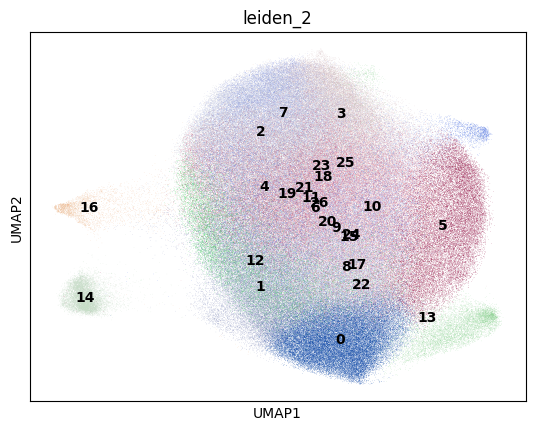

In [46]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

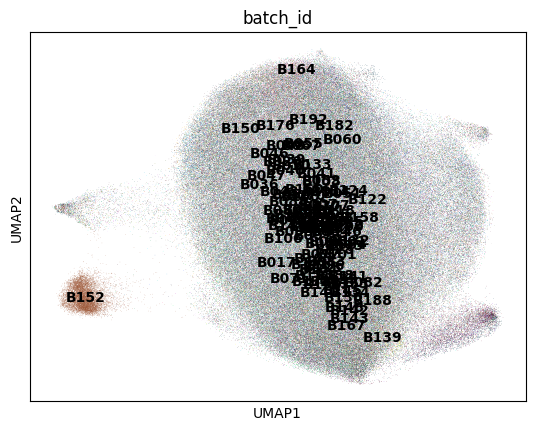

In [47]:
sc.pl.umap(adata, color = 'batch_id', legend_loc = 'on data')

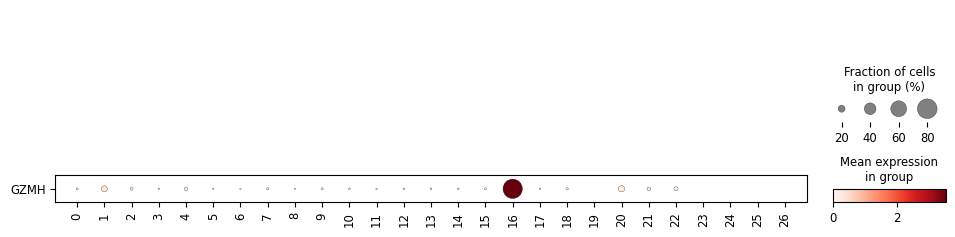

In [48]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = ['GZMH'], swap_axes = True)

### GZMH Selection

Filtering

In [49]:
adata, n_removed = remove_cl(
    adata, 'GZMH', 'above', 0.4, 'leiden_2'
)
n_removed

['16']


3346

Reason

In [50]:
update_df = pd.DataFrame(
    {'AIFI_L3': [cell_type],
     'update_type': ['remove'],
     'n_total': [total_cells],
     'n_updated': [n_removed],
     'change_to': ['Mislabeled GZMH+']
    }
)
update_list.append(update_df)

### Reprocess filtered and combined cells

In [51]:
adata = process_adata(adata, resolution = 2)
adata = propagate_hierarchy(adata, hierarchy_df)

Normalizing; WARNING: adata.X seems to be already log-transformed.
Finding HVGs; Scaling; PCA; Neighbors; Leiden; UMAP; Renormalizing


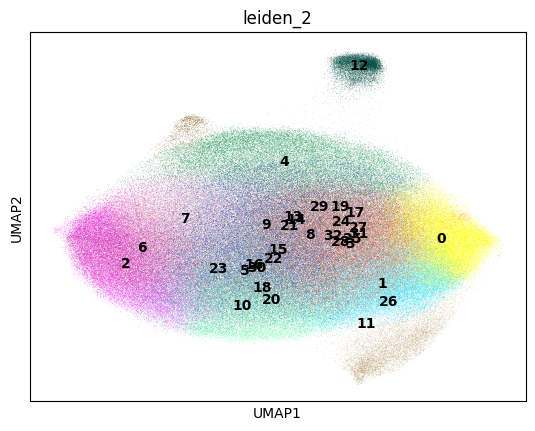

In [52]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Save filtered cells

In [53]:
out_type = format_cell_type(cell_type)
out_file = 'output/diha_filtered_celltypist_L3_{ot}_{d}.h5ad'.format(ot = out_type, d = date.today())
adata.write_h5ad(out_file)
out_files.append(out_file)

## Filter Memory CD4 Treg

### Proposed updates

- Reassign MKI67-high cluster to Proliferating T cell

In [54]:
cell_type = 'Memory CD4 Treg'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [55]:
type_uuid

'59959bb2-b20a-4d1b-acb5-5a048ed3986f'

In [56]:
adata = read_adata_uuid(type_uuid)
total_cells = adata.shape[0]

In [57]:
adata.obs['predicted_AIFI_L3'] = adata.obs['AIFI_L3']

### Clustering

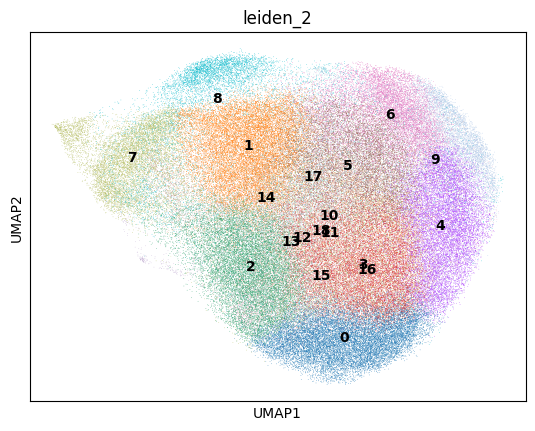

In [58]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

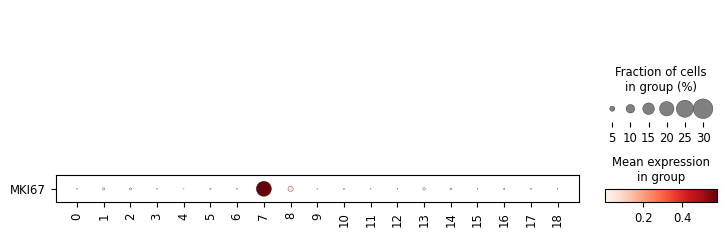

In [59]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = ['MKI67'], swap_axes = True)

### MKI67 selection

Extraction

In [60]:
cd4_mem_prolif_adata, n_extracted = extract_cl(
    adata, 'MKI67', 'above', 0.2, 'leiden_2'
)
cd4_mem_prolif_adata.obs['AIFI_L3'] = 'Proliferating T cell'
n_extracted

['7']


8713

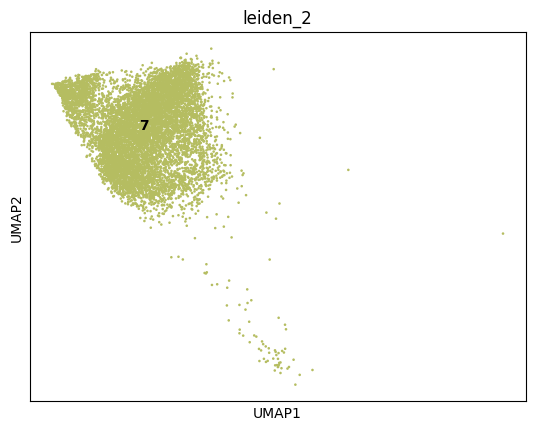

In [61]:
sc.pl.umap(cd4_mem_prolif_adata, color = 'leiden_2', legend_loc = 'on data')

### Iteratively cluster MKI67+

In [62]:
cd4_mem_prolif_adata = process_adata(cd4_mem_prolif_adata, resolution = 1)

Normalizing; WARNING: adata.X seems to be already log-transformed.
Finding HVGs; Scaling; PCA; Neighbors; Leiden; UMAP; Renormalizing


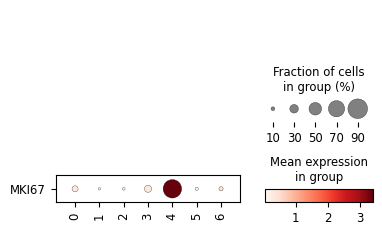

In [63]:
sc.pl.dotplot(cd4_mem_prolif_adata, groupby = 'leiden_1', var_names = ['MKI67'], swap_axes = True)

### Iteratively select MKI67+

In [64]:
cd4_mem_prolif_adata, n_extracted = extract_cl(
    cd4_mem_prolif_adata, 'MKI67', 'above', 0.6, 'leiden_1'
)
n_extracted

['4']


1026

Removal

In [65]:
remove_idx = adata.obs['barcodes'].isin(cd4_mem_prolif_adata.obs['barcodes'])
keep_idx = [not x for x in remove_idx]
adata = adata[keep_idx]

Reason

In [66]:
update_df = pd.DataFrame(
    {'AIFI_L3': [cell_type],
     'update_type': ['reassign'],
     'n_total': [total_cells],
     'n_updated': [n_extracted],
     'change_to': ['Proliferating T cell']
    }
)
update_list.append(update_df)

### Reprocess filtered cells

In [67]:
adata = process_adata(adata, resolution = 2)
adata = propagate_hierarchy(adata, hierarchy_df)

Normalizing; WARNING: adata.X seems to be already log-transformed.
Finding HVGs; Scaling; PCA; Neighbors; Leiden; UMAP; Renormalizing


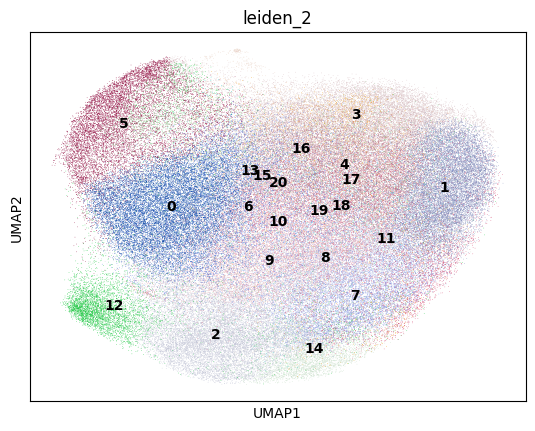

In [68]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Save filtered cells

In [69]:
out_type = format_cell_type(cell_type)
out_file = 'output/diha_filtered_celltypist_L3_{ot}_{d}.h5ad'.format(ot = out_type, d = date.today())
adata.write_h5ad(out_file)
out_files.append(out_file)

## Filter DN T cell

### Proposed updates

- Remove MS4A1+ cells as B cell doublets

In [70]:
cell_type = 'DN T cell'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [71]:
type_uuid

'9bf54fcf-d768-4a40-a9a4-698606417008'

In [72]:
adata = read_adata_uuid(type_uuid)
total_cells = adata.shape[0]

In [73]:
adata.obs['predicted_AIFI_L3'] = adata.obs['AIFI_L3']

### Clustering

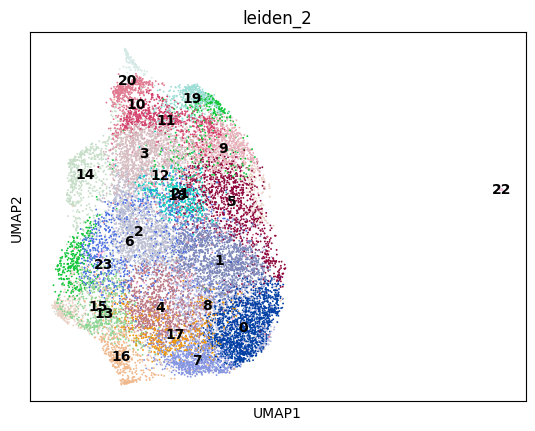

In [74]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

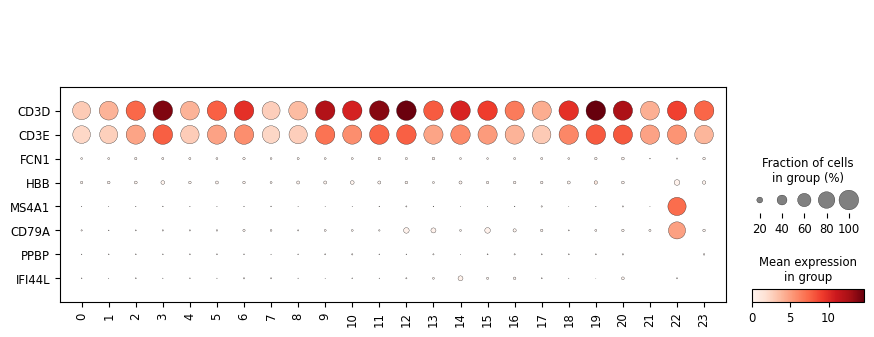

In [75]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

### MS4A1 Selection

Filtering

In [76]:
adata, n_removed = remove_cl(
    adata, 'MS4A1', 'above', 0.5, 'leiden_2'
)
n_removed

['22']


42

Reason

In [77]:
update_df = pd.DataFrame(
    {'AIFI_L3': [cell_type],
     'update_type': ['remove'],
     'n_total': [total_cells],
     'n_updated': [n_removed],
     'change_to': ['B cell Doublet']
    }
)
update_list.append(update_df)

### Reprocess filtered cells

In [78]:
adata = process_adata(adata, resolution = 2)
adata = propagate_hierarchy(adata, hierarchy_df)

Normalizing; WARNING: adata.X seems to be already log-transformed.
Finding HVGs; Scaling; PCA; Neighbors; Leiden; UMAP; Renormalizing


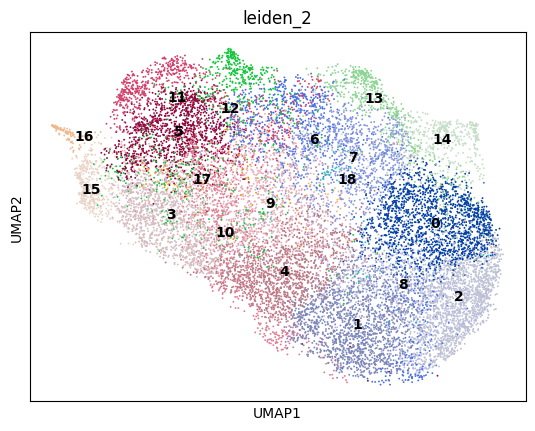

In [79]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Save filtered cells

In [80]:
out_type = format_cell_type(cell_type)
out_file = 'output/diha_filtered_celltypist_L3_{ot}_{d}.h5ad'.format(ot = out_type, d = date.today())
adata.write_h5ad(out_file)
out_files.append(out_file)

## Filter KLRF1- effector Vd1 gdT

### Proposed updates

- Remove TRDC-low clusters as mislabeled
- Remove CD27+ cluster as TCRab/gd doublet

In [81]:
cell_type = 'KLRF1- effector Vd1 gdT'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [82]:
type_uuid

'0f4a74c9-7899-4d0b-91e5-156429aae4df'

In [83]:
adata = read_adata_uuid(type_uuid)
total_cells = adata.shape[0]

In [84]:
adata.obs['predicted_AIFI_L3'] = adata.obs['AIFI_L3']

### Clustering

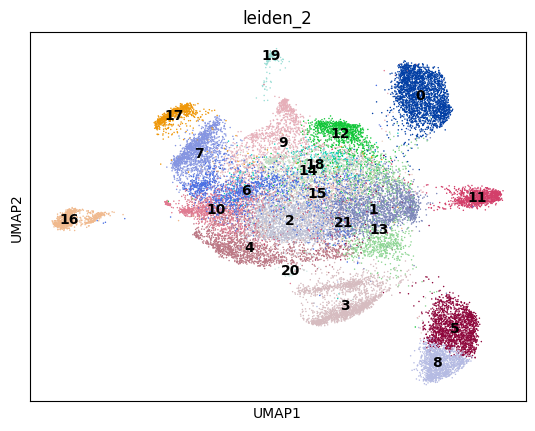

In [85]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

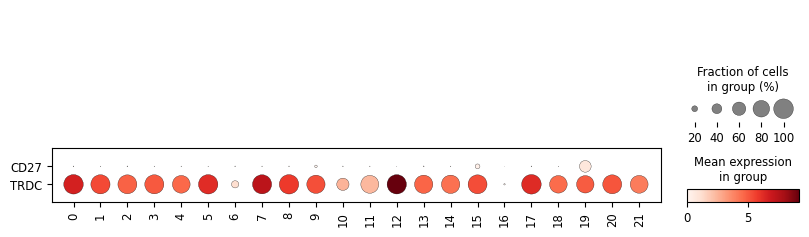

In [86]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = ['CD27','TRDC'], swap_axes = True)

### TRDC-low Selection

Filtering

In [87]:
adata, n_removed = remove_cl(
    adata, 'TRDC', 'below', 0.5, 'leiden_2'
)
n_removed

['6', '16']


2308

Reason

In [88]:
update_df = pd.DataFrame(
    {'AIFI_L3': [cell_type],
     'update_type': ['remove'],
     'n_total': [total_cells],
     'n_updated': [n_removed],
     'change_to': ['Mislabeled TRDC-']
    }
)
update_list.append(update_df)

### CD27 Selection

Filtering

In [89]:
adata, n_removed = remove_cl(
    adata, 'CD27', 'above', 0.4, 'leiden_2'
)
n_removed

['19']


226

Reason

In [90]:
update_df = pd.DataFrame(
    {'AIFI_L3': [cell_type],
     'update_type': ['remove'],
     'n_total': [total_cells],
     'n_updated': [n_removed],
     'change_to': ['abT/gdT doublet']
    }
)
update_list.append(update_df)

### Reprocess filtered cells

In [91]:
adata = process_adata(adata, resolution = 2)
adata = propagate_hierarchy(adata, hierarchy_df)

Normalizing; WARNING: adata.X seems to be already log-transformed.
Finding HVGs; Scaling; PCA; Neighbors; Leiden; UMAP; Renormalizing


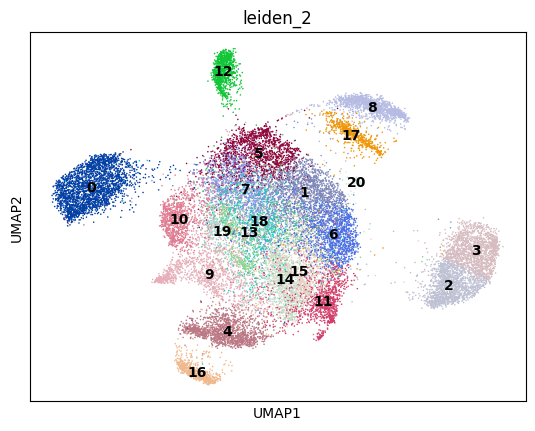

In [92]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Save filtered cells

In [93]:
out_type = format_cell_type(cell_type)
out_file = 'output/diha_filtered_celltypist_L3_{ot}_{d}.h5ad'.format(ot = out_type, d = date.today())
adata.write_h5ad(out_file)
out_files.append(out_file)

## Filter KLRF1+ effector Vd1 gdT

### Proposed updates

- Reassign TRDV2+ cluster (20) as GZMB+ Vd2 gdT
- Remove TRDC/TRAC+ cluster (21) as ab/gd doublet

In [94]:
cell_type = 'KLRF1+ effector Vd1 gdT'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [95]:
type_uuid

'0cd94eb5-45d3-41f0-b08f-7d9a362243ba'

In [96]:
adata = read_adata_uuid(type_uuid)
total_cells = adata.shape[0]

In [97]:
adata.obs['predicted_AIFI_L3'] = adata.obs['AIFI_L3']

### Clustering

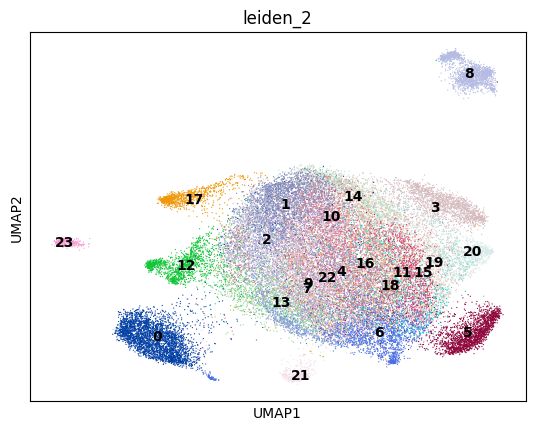

In [98]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

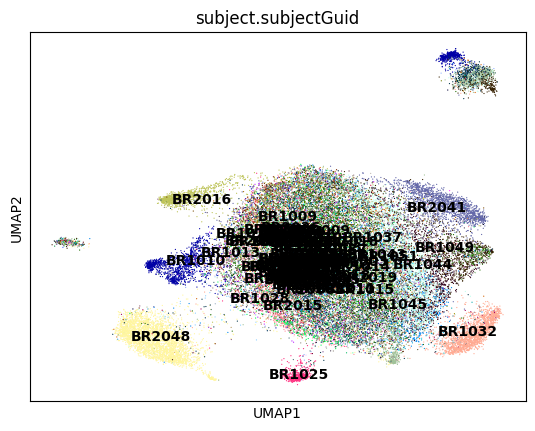

In [99]:
sc.pl.umap(adata, color = 'subject.subjectGuid', legend_loc = 'on data')

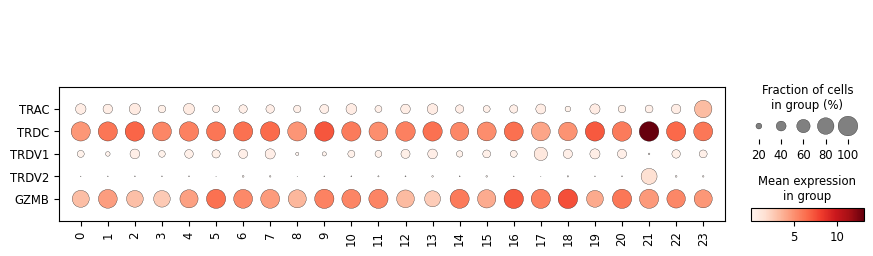

In [100]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = ['TRAC','TRDC','TRDV1','TRDV2','GZMB'], swap_axes = True)

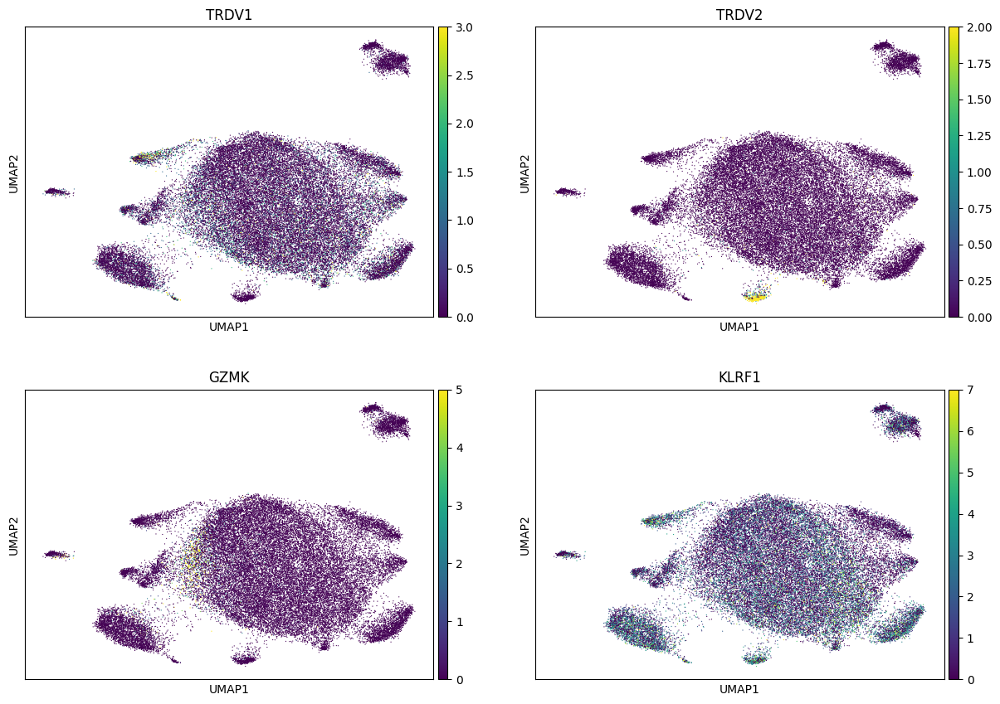

In [101]:
sc.pl.umap(adata, color = ['TRDV1', 'TRDV2', 'GZMK', 'KLRF1'], vmax = 'p99', ncols = 2)

### TRAC Selection

Filtering

In [102]:
adata, n_removed = remove_cl(
    adata, 'TRAC', 'above', 0.8, 'leiden_2'
)
n_removed

['23']


433

Reason

In [103]:
update_df = pd.DataFrame(
    {'AIFI_L3': [cell_type],
     'update_type': ['remove'],
     'n_total': [total_cells],
     'n_updated': [n_removed],
     'change_to': ['abT/gdT Doublet']
    }
)
update_list.append(update_df)

### TRDV2 selection

Extraction

In [104]:
klrf1_vd2_adata, n_extracted = extract_cl(
    adata, 'TRDV2', 'above', 0.6, 'leiden_2'
)
klrf1_vd2_adata.obs['AIFI_L3'] = 'GZMB+ Vd2 gdT'
n_extracted

['21']


650

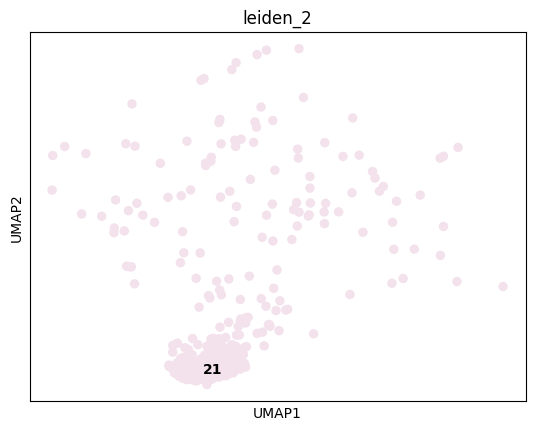

In [105]:
sc.pl.umap(klrf1_vd2_adata, color = 'leiden_2', legend_loc = 'on data')

Removal

In [106]:
adata, n_removed = remove_cl(
    adata, 'TRDV2', 'above', 0.6, 'leiden_2'
)
n_removed

['21']


650

Reason

In [107]:
update_df = pd.DataFrame(
    {'AIFI_L3': [cell_type],
     'update_type': ['reassign'],
     'n_total': [total_cells],
     'n_updated': [n_removed],
     'change_to': ['GZMB+ Vd2 gdT']
    }
)
update_list.append(update_df)

### Reprocess filtered cells

In [108]:
adata = process_adata(adata, resolution = 2)
adata = propagate_hierarchy(adata, hierarchy_df)

Normalizing; WARNING: adata.X seems to be already log-transformed.
Finding HVGs; Scaling; PCA; Neighbors; Leiden; UMAP; Renormalizing


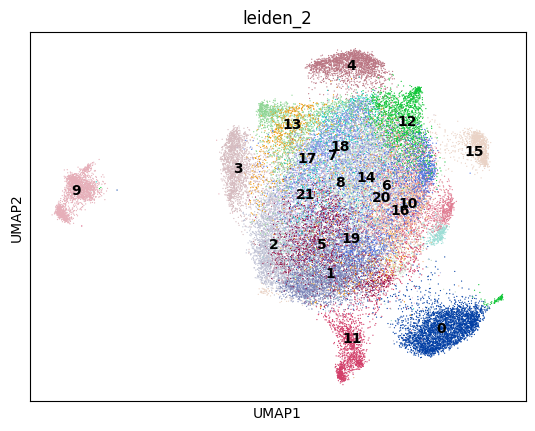

In [109]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Save filtered cells

In [110]:
out_type = format_cell_type(cell_type)
out_file = 'output/diha_filtered_celltypist_L3_{ot}_{d}.h5ad'.format(ot = out_type, d = date.today())
adata.write_h5ad(out_file)
out_files.append(out_file)

## Filter Naive CD4 Treg

### Proposed updates

Filter GZMK+ cells as mislabeled

In [111]:
cell_type = 'Naive CD4 Treg'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [112]:
type_uuid

'bb72112f-9bf8-412f-bd52-74059347ec15'

In [113]:
adata = read_adata_uuid(type_uuid)
adata.obs['predicted_AIFI_L3'] = adata.obs['AIFI_L3']

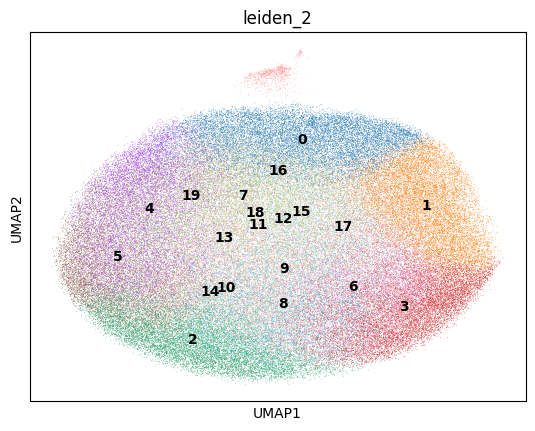

In [114]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

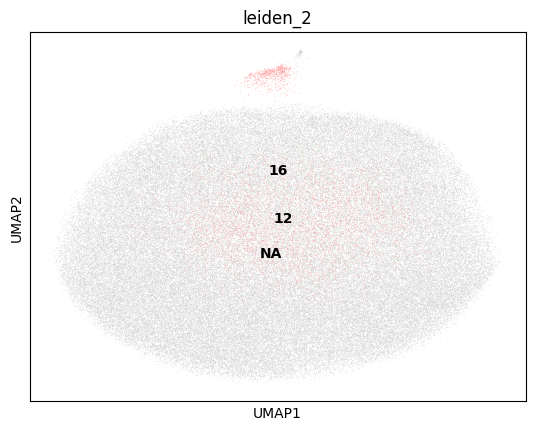

In [115]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data', groups = ['12','16'])

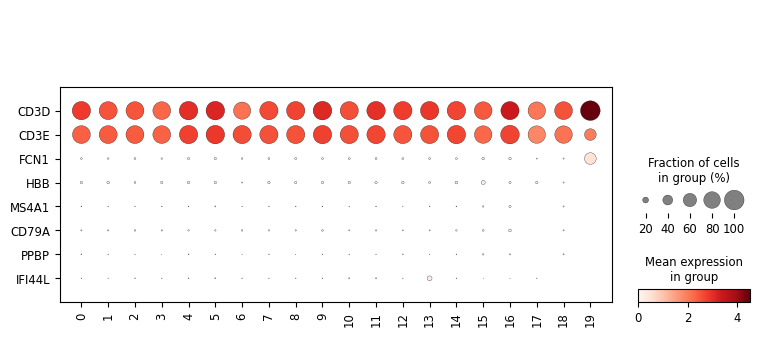

In [116]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

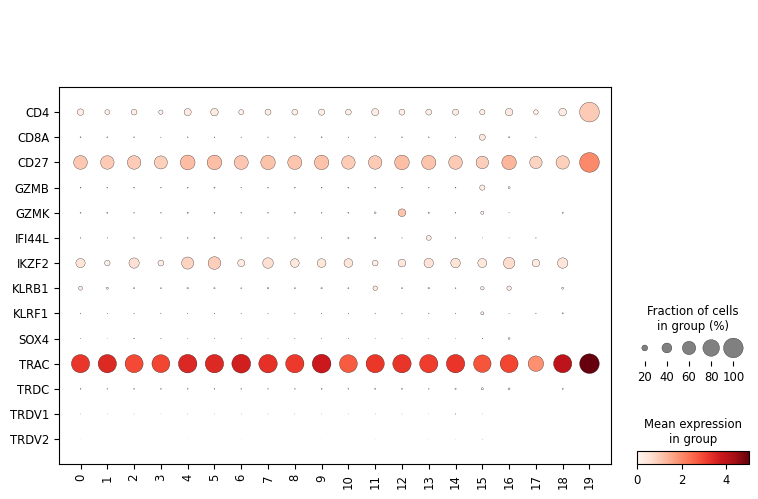

In [117]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

### GZMK selection

Extraction

In [118]:
gzmk_adata, n_extracted = extract_cl(
    adata, 'GZMK', 'above', 0.2, 'leiden_2'
)
n_extracted

['12']


5889

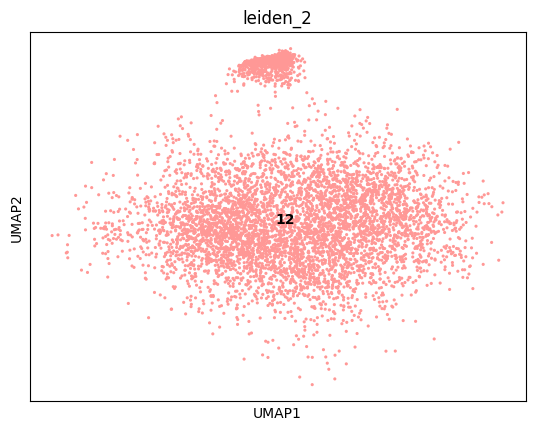

In [119]:
sc.pl.umap(gzmk_adata, color = 'leiden_2', legend_loc = 'on data')

### Iteratively cluster GZMK+

In [120]:
gzmk_adata = process_adata(gzmk_adata, resolution = 2)

Normalizing; WARNING: adata.X seems to be already log-transformed.
Finding HVGs; Scaling; PCA; Neighbors; Leiden; UMAP; Renormalizing


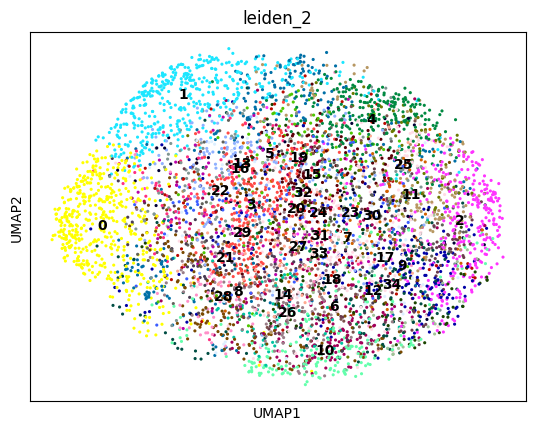

In [121]:
sc.pl.umap(gzmk_adata, color = 'leiden_2', legend_loc = 'on data')

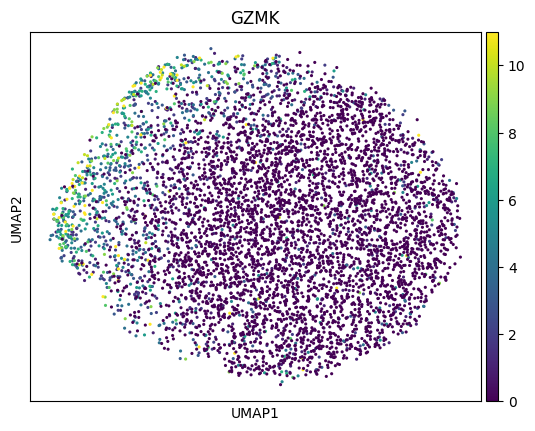

In [122]:
sc.pl.umap(gzmk_adata, color = 'GZMK', vmax = 'p99')

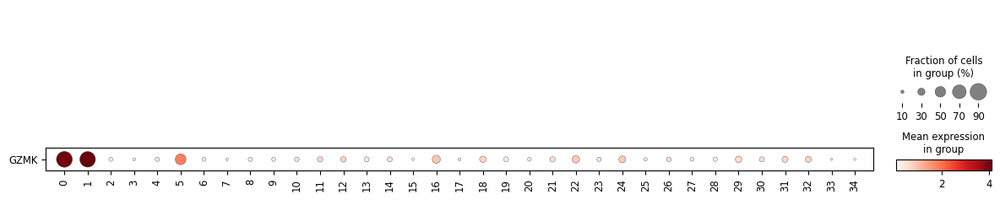

In [123]:
sc.pl.dotplot(gzmk_adata, groupby = 'leiden_2', var_names = ['GZMK'], swap_axes = True)

### Iteratively select GZMK+

In [124]:
gzmk_adata, n_extracted = extract_cl(
    gzmk_adata, 'GZMK', 'above', 0.6, 'leiden_2'
)
n_extracted

['0', '1']


951

Removal

In [125]:
remove_idx = adata.obs['barcodes'].isin(gzmk_adata.obs['barcodes'])
keep_idx = [not x for x in remove_idx]
adata = adata[keep_idx]

Reason

In [126]:
update_df = pd.DataFrame(
    {'AIFI_L3': [cell_type],
     'update_type': ['reassign'],
     'n_total': [total_cells],
     'n_updated': [n_extracted],
     'change_to': ['Mislabeled GZMK+']
    }
)
update_list.append(update_df)

### GZMB selection

Extraction

In [127]:
gzmb_adata, n_extracted = extract_cl(
    adata, 'GZMB', 'above', 0.1, 'leiden_2'
)
n_extracted

['15']


462

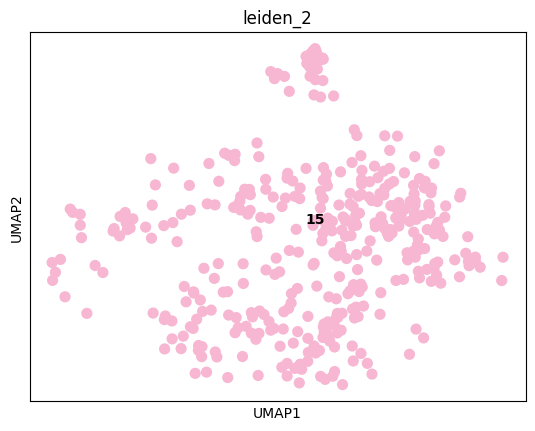

In [128]:
sc.pl.umap(gzmb_adata, color = 'leiden_2', legend_loc = 'on data')

### Iteratively cluster GZMB+

In [129]:
gzmb_adata = process_adata(gzmb_adata, resolution = 1)

Normalizing; WARNING: adata.X seems to be already log-transformed.
Finding HVGs; Scaling; PCA; Neighbors; Leiden; UMAP; Renormalizing


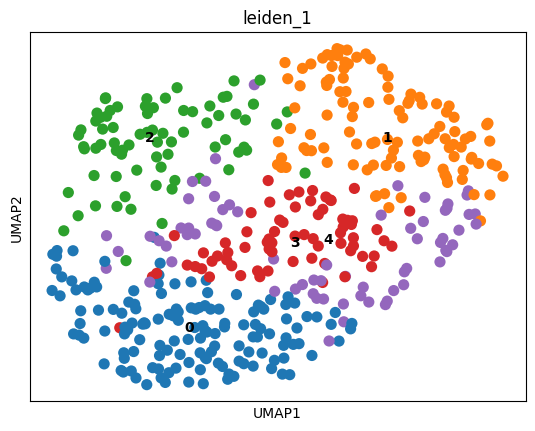

In [130]:
sc.pl.umap(gzmb_adata, color = 'leiden_1', legend_loc = 'on data')

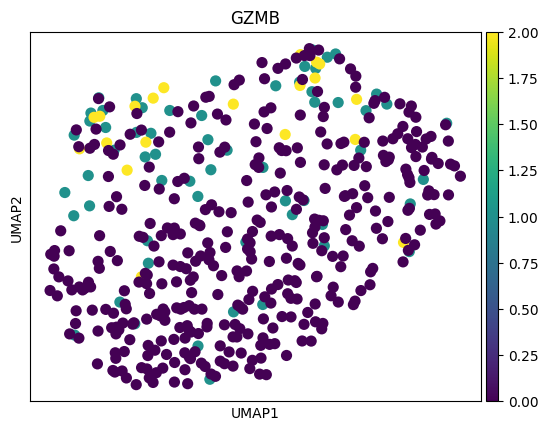

In [131]:
sc.pl.umap(gzmb_adata, color = 'GZMB', vmax = 'p99')

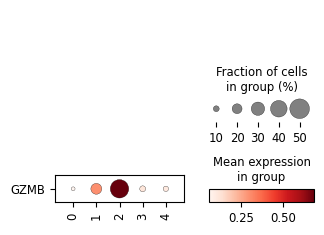

In [132]:
sc.pl.dotplot(gzmb_adata, groupby = 'leiden_1', var_names = ['GZMB'], swap_axes = True)

### Iteratively select GZMK+

In [133]:
gzmb_adata, n_extracted = extract_cl(
    gzmb_adata, 'GZMB', 'above', 0.2, 'leiden_1'
)
n_extracted

['1', '2']


184

Removal

In [134]:
remove_idx = adata.obs['barcodes'].isin(gzmb_adata.obs['barcodes'])
keep_idx = [not x for x in remove_idx]
adata = adata[keep_idx]

Reason

In [135]:
update_df = pd.DataFrame(
    {'AIFI_L3': [cell_type],
     'update_type': ['reassign'],
     'n_total': [total_cells],
     'n_updated': [n_extracted],
     'change_to': ['Mislabeled GZMB+']
    }
)
update_list.append(update_df)

### Reprocess filtered cells

In [136]:
adata = process_adata(adata, resolution = 2)
adata = propagate_hierarchy(adata, hierarchy_df)

Normalizing; WARNING: adata.X seems to be already log-transformed.
Finding HVGs; Scaling; PCA; Neighbors; Leiden; UMAP; Renormalizing


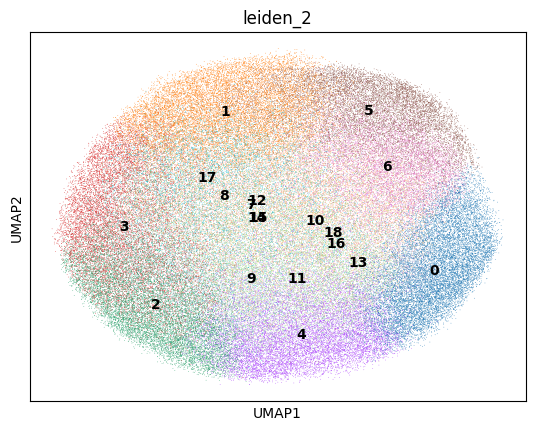

In [137]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Save filtered cells

In [138]:
out_type = format_cell_type(cell_type)
out_file = 'output/diha_filtered_celltypist_L3_{ot}_{d}.h5ad'.format(ot = out_type, d = date.today())
adata.write_h5ad(out_file)
out_files.append(out_file)

## Filter Naive Vd1 gdT

### Proposed updates

- Remove KLRB1+ cluster as Mislabeled
- Remove TRDC- cluster (8) as ab mislabeled

In [139]:
cell_type = 'Naive Vd1 gdT'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [140]:
type_uuid

'98c1b2e6-fd23-479b-8dae-6fa50e1dcf86'

In [141]:
adata = read_adata_uuid(type_uuid)
total_cells = adata.shape[0]

In [142]:
adata.obs['predicted_AIFI_L3'] = adata.obs['AIFI_L3']

### Clustering

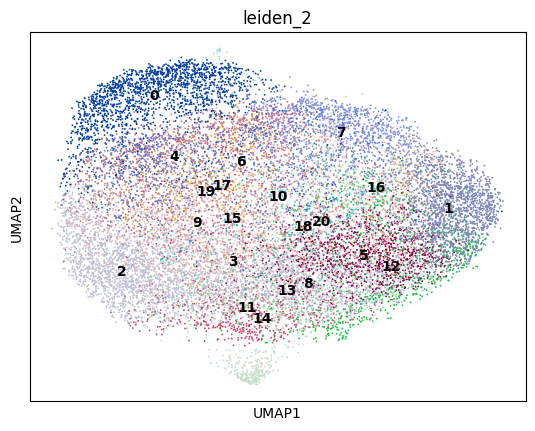

In [143]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

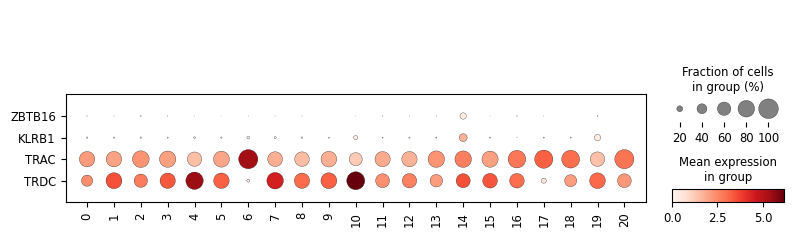

In [144]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = ['ZBTB16','KLRB1','TRAC','TRDC'], swap_axes = True)

### ZBTB16 Selection

Filtering

In [145]:
adata, n_removed = remove_cl(
    adata, 'ZBTB16', 'above', 0.2, 'leiden_2'
)
n_removed

['14']


564

Reason

In [146]:
update_df = pd.DataFrame(
    {'AIFI_L3': [cell_type],
     'update_type': ['remove'],
     'n_total': [total_cells],
     'n_updated': [n_removed],
     'change_to': ['Mislabeled ZBTB16+']
    }
)
update_list.append(update_df)

### TRDC- Selection

Filtering

In [147]:
adata, n_removed = remove_cl(
    adata, 'TRDC', 'below', 0.2, 'leiden_2'
)
n_removed

['6', '17']


1366

Reason

In [148]:
update_df = pd.DataFrame(
    {'AIFI_L3': [cell_type],
     'update_type': ['remove'],
     'n_total': [total_cells],
     'n_updated': [n_removed],
     'change_to': ['Mislabeled TRDC-']
    }
)
update_list.append(update_df)

### Reprocess filtered cells

In [149]:
adata = process_adata(adata, resolution = 2)
adata = propagate_hierarchy(adata, hierarchy_df)

Normalizing; WARNING: adata.X seems to be already log-transformed.
Finding HVGs; Scaling; PCA; Neighbors; Leiden; UMAP; Renormalizing


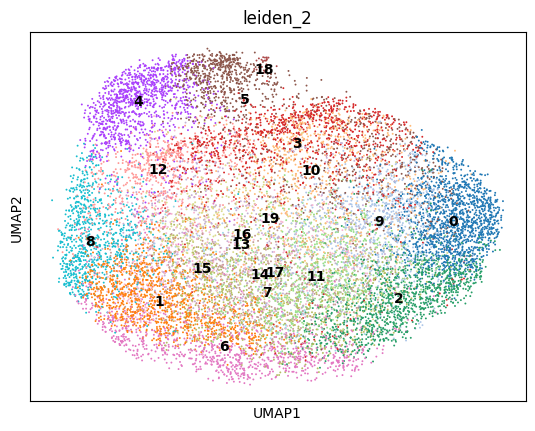

In [150]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Save filtered cells

In [151]:
out_type = format_cell_type(cell_type)
out_file = 'output/diha_filtered_celltypist_L3_{ot}_{d}.h5ad'.format(ot = out_type, d = date.today())
adata.write_h5ad(out_file)
out_files.append(out_file)

## Filter SOX4+ Vd1 gdT

### Proposed updates

- Remove KLRB1+ cluster as Mislabeled
- Remove TRDC- clusters as Mislabeled

In [152]:
cell_type = 'SOX4+ Vd1 gdT'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [153]:
type_uuid

'2e15c2c7-0ba5-480d-b476-b1bb2f594e40'

In [154]:
adata = read_adata_uuid(type_uuid)
total_cells = adata.shape[0]

In [155]:
adata.obs['predicted_AIFI_L3'] = adata.obs['AIFI_L3']

### Clustering

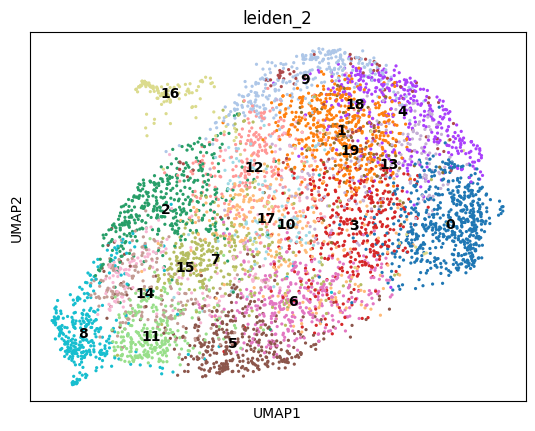

In [156]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

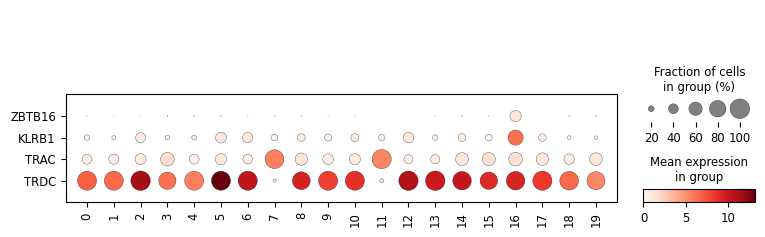

In [157]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = ['ZBTB16','KLRB1','TRAC','TRDC'], swap_axes = True)

### ZBTB16 Selection

Filtering

In [158]:
adata, n_removed = remove_cl(
    adata, 'ZBTB16', 'above', 0.4, 'leiden_2'
)
n_removed

['16']


144

Reason

In [159]:
update_df = pd.DataFrame(
    {'AIFI_L3': [cell_type],
     'update_type': ['remove'],
     'n_total': [total_cells],
     'n_updated': [n_removed],
     'change_to': ['Mislabeled ZBTB16+']
    }
)
update_list.append(update_df)

### TRDC- Selection

Filtering

In [160]:
adata, n_removed = remove_cl(
    adata, 'TRDC', 'below', 0.2, 'leiden_2'
)
n_removed

['7', '11']


597

Reason

In [161]:
update_df = pd.DataFrame(
    {'AIFI_L3': [cell_type],
     'update_type': ['remove'],
     'n_total': [total_cells],
     'n_updated': [n_removed],
     'change_to': ['Mislabeled TRDC-']
    }
)
update_list.append(update_df)

### Reprocess filtered cells

In [162]:
adata = process_adata(adata, resolution = 2)
adata = propagate_hierarchy(adata, hierarchy_df)

Normalizing; WARNING: adata.X seems to be already log-transformed.
Finding HVGs; Scaling; PCA; Neighbors; Leiden; UMAP; Renormalizing


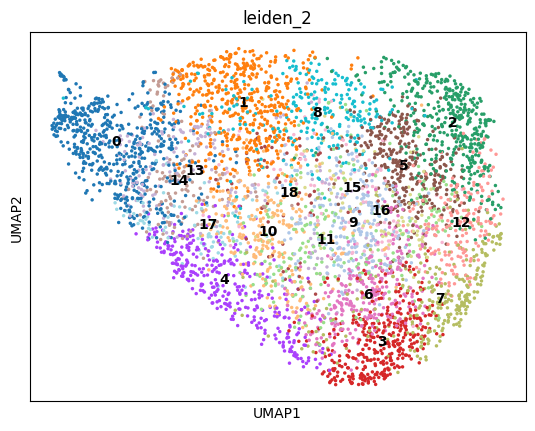

In [163]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Save filtered cells

In [164]:
out_type = format_cell_type(cell_type)
out_file = 'output/diha_filtered_celltypist_L3_{ot}_{d}.h5ad'.format(ot = out_type, d = date.today())
adata.write_h5ad(out_file)
out_files.append(out_file)

## Filter GZMK+ Vd2 gdT

### Proposed updates

- Remove CD8A+ clusters as doublets
- Remove Doublet score-high cluster as doublets

In [165]:
cell_type = 'GZMK+ Vd2 gdT'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [166]:
type_uuid

'dce3a864-0d67-4995-b8bf-373fa563cfe0'

In [167]:
adata = read_adata_uuid(type_uuid)
total_cells = adata.shape[0]

In [168]:
adata.obs['predicted_AIFI_L3'] = adata.obs['AIFI_L3']

### Clustering

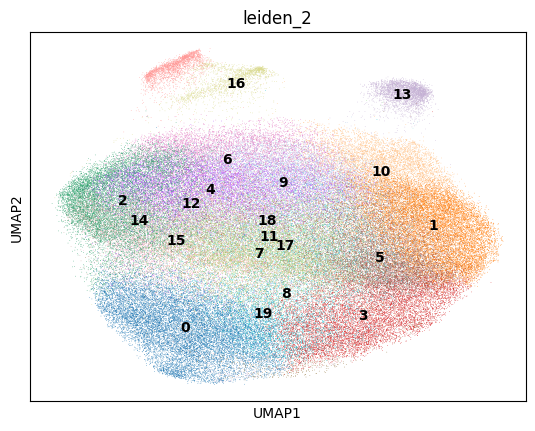

In [169]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

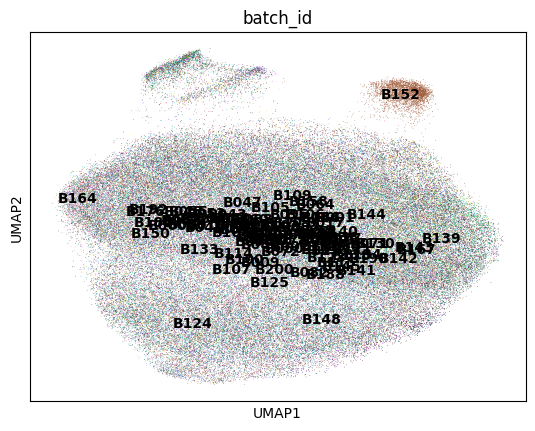

In [170]:
sc.pl.umap(adata, color = 'batch_id', legend_loc = 'on data')

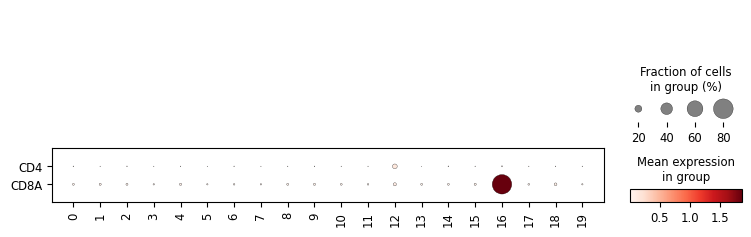

In [171]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = ['CD4','CD8A'], swap_axes = True)

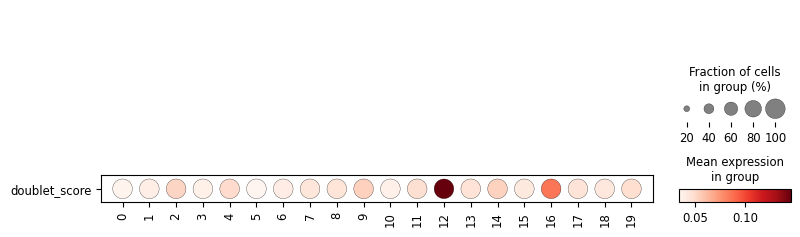

In [172]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = ['doublet_score'], swap_axes = True)

### CD8A Selection

Filtering

In [173]:
adata, n_removed = remove_cl(
    adata, 'CD8A', 'above', 0.5, 'leiden_2'
)
n_removed

['16']


2365

Reason

In [174]:
update_df = pd.DataFrame(
    {'AIFI_L3': [cell_type],
     'update_type': ['remove'],
     'n_total': [total_cells],
     'n_updated': [n_removed],
     'change_to': ['CD8A Doublet']
    }
)
update_list.append(update_df)

### High doublet score selection

In [175]:
cl_mean_doublet_score = sc.pl.dotplot(
        adata, groupby = 'leiden_2',
        var_names = 'doublet_score',
        return_fig = True
    ).dot_color_df
select_cl = cl_mean_doublet_score.index[cl_mean_doublet_score['doublet_score'] > 0.07].tolist()
select_cl

['12']

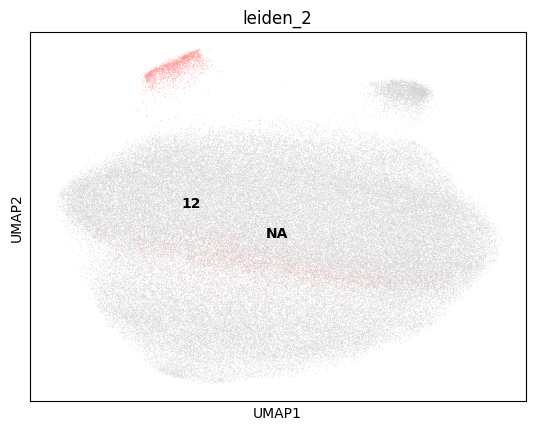

In [176]:
sc.pl.umap(adata, color = 'leiden_2', groups = select_cl, legend_loc = 'on data')

### High doublet score filtering

In [177]:
remove_idx = adata.obs['leiden_2'].isin(select_cl)
n_removed = sum(remove_idx)
keep_idx = [not x for x in remove_idx]
adata = adata[keep_idx]

In [178]:
n_removed

4978

### High doublet score reason

In [179]:
update_df = pd.DataFrame(
    {'AIFI_L3': [cell_type],
     'update_type': ['reassign'],
     'n_total': [total_cells],
     'n_updated': [n_removed],
     'change_to': ['Doublets']
    }
)
update_list.append(update_df)

### Reprocess filtered cells

In [180]:
adata = process_adata(adata, resolution = 2)
adata = propagate_hierarchy(adata, hierarchy_df)

Normalizing; WARNING: adata.X seems to be already log-transformed.
Finding HVGs; Scaling; PCA; Neighbors; Leiden; UMAP; Renormalizing


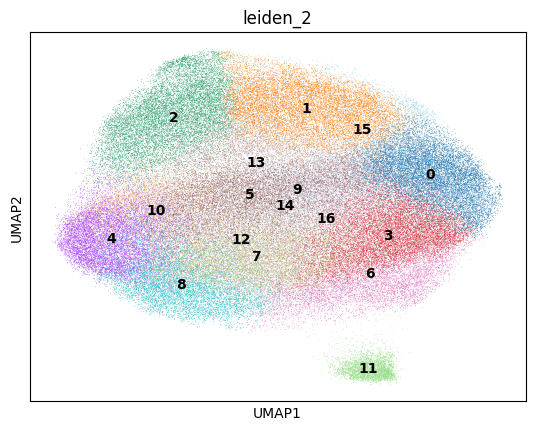

In [181]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Save filtered cells

In [182]:
out_type = format_cell_type(cell_type)
out_file = 'output/diha_filtered_celltypist_L3_{ot}_{d}.h5ad'.format(ot = out_type, d = date.today())
adata.write_h5ad(out_file)
out_files.append(out_file)

## Filter KLRB1+ memory CD8 Treg

### Proposed updates

- Remove GNLY-high cluster as mislabeled
- Remove PPBP-high cluster as Platelet doublets

In [183]:
cell_type = 'KLRB1+ memory CD8 Treg'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [184]:
type_uuid

'85a50dcb-af01-4288-8273-4f06b0e36c43'

In [185]:
adata = read_adata_uuid(type_uuid)
total_cells = adata.shape[0]

In [186]:
adata.obs['predicted_AIFI_L3'] = adata.obs['AIFI_L3']

### Clustering

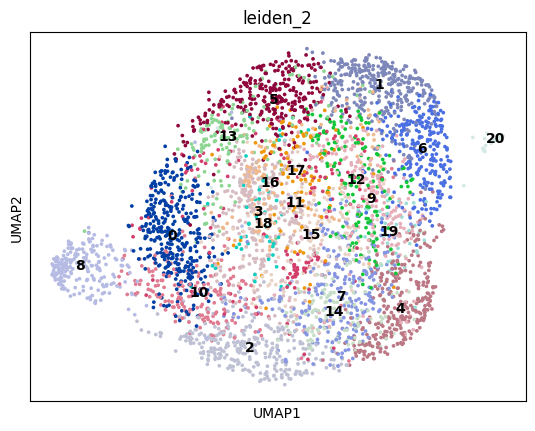

In [187]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

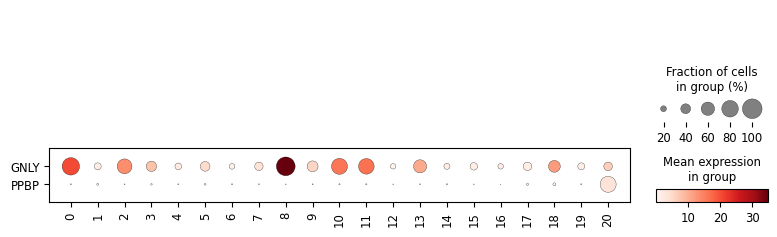

In [188]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = ['GNLY','PPBP'], swap_axes = True)

### GNLY Selection

Filtering

In [189]:
adata, n_removed = remove_cl(
    adata, 'GNLY', 'above', 0.9, 'leiden_2'
)
n_removed

['8']


223

Reason

In [190]:
update_df = pd.DataFrame(
    {'AIFI_L3': [cell_type],
     'update_type': ['remove'],
     'n_total': [total_cells],
     'n_updated': [n_removed],
     'change_to': ['Mislabeled GNLY+']
    }
)
update_list.append(update_df)

### PPBP Selection

Filtering

In [191]:
adata, n_removed = remove_cl(
    adata, 'PPBP', 'above', 0.6, 'leiden_2'
)
n_removed

['20']


42

Reason

In [192]:
update_df = pd.DataFrame(
    {'AIFI_L3': [cell_type],
     'update_type': ['remove'],
     'n_total': [total_cells],
     'n_updated': [n_removed],
     'change_to': ['Platelet doublet']
    }
)
update_list.append(update_df)

### Reprocess filtered cells

In [193]:
adata = process_adata(adata, resolution = 2)
adata = propagate_hierarchy(adata, hierarchy_df)

Normalizing; WARNING: adata.X seems to be already log-transformed.
Finding HVGs; Scaling; PCA; Neighbors; Leiden; UMAP; Renormalizing


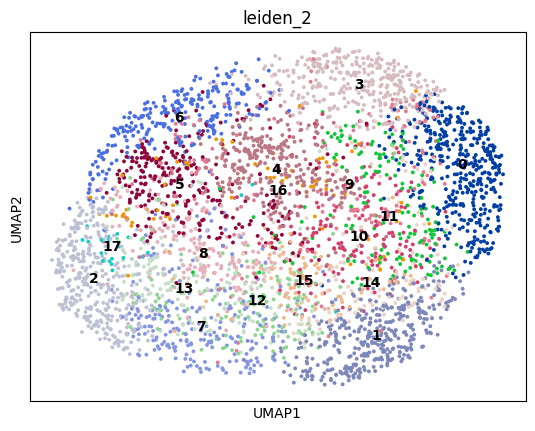

In [194]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Save filtered cells

In [195]:
out_type = format_cell_type(cell_type)
out_file = 'output/diha_filtered_celltypist_L3_{ot}_{d}.h5ad'.format(ot = out_type, d = date.today())
adata.write_h5ad(out_file)
out_files.append(out_file)

## Filter KLRB1+ memory CD4 Treg

### Proposed updates

- Reassign GZMK-high cluster as GZMK+ memory CD4 Treg
- Remove CCL5-high cluster as mislabeled

In [196]:
cell_type = 'KLRB1+ memory CD4 Treg'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [197]:
type_uuid

'5da8e0ae-eb35-4e52-b123-1a1d8734abc8'

In [198]:
adata = read_adata_uuid(type_uuid)
total_cells = adata.shape[0]

In [199]:
adata.obs['predicted_AIFI_L3'] = adata.obs['AIFI_L3']

### Clustering

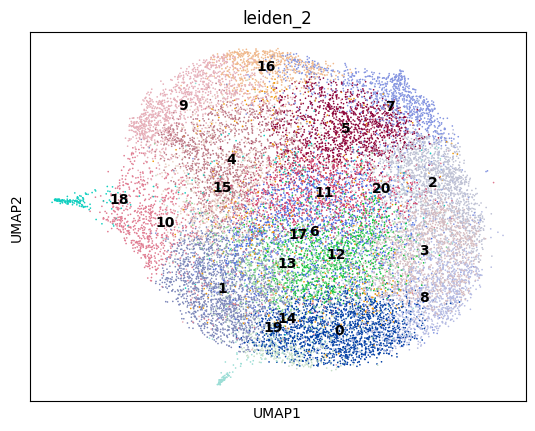

In [200]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

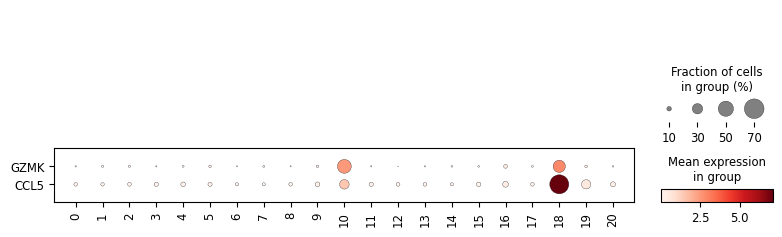

In [201]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = ['GZMK','CCL5'], swap_axes = True)

### CCL5 Filtering

In [ ]:
adata, n_removed = remove_cl(
    adata, 'CCL5', 'above', 0.6, 'leiden_2'
)
n_removed

['18']


276

### CCL5 Reason

In [ ]:
update_df = pd.DataFrame(
    {'AIFI_L3': [cell_type],
     'update_type': ['remove'],
     'n_total': [total_cells],
     'n_updated': [n_removed],
     'change_to': ['Mislabeled CCL5+']
    }
)
update_list.append(update_df)

### GZMK selection

In [ ]:
klrb1_gzmk_adata, n_extracted = extract_cl(
    adata, 'GZMK', 'above', 0.4, 'leiden_2'
)
klrb1_gzmk_adata.obs['AIFI_L3'] = 'GZMK+ memory CD4 Treg'
n_extracted

['10']


1071

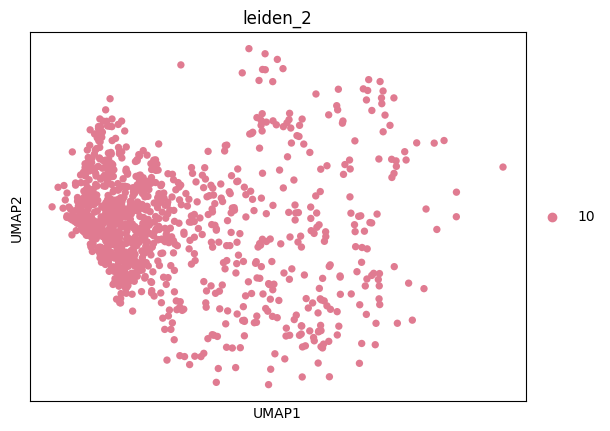

In [ ]:
sc.pl.umap(klrb1_gzmk_adata, color = 'leiden_2')

### GZMK Filtering

In [ ]:
adata, n_removed = remove_cl(
    adata, 'GZMK', 'above', 0.4, 'leiden_2'
)
n_removed

['10']


1071

### GZMK Reason

In [ ]:
update_df = pd.DataFrame(
    {'AIFI_L3': [cell_type],
     'update_type': ['reassign'],
     'n_total': [total_cells],
     'n_updated': [n_removed],
     'change_to': ['GZMK+ memory CD4 Treg']
    }
)
update_list.append(update_df)

### Reprocess filtered cells

In [ ]:
adata = process_adata(adata, resolution = 2)
adata = propagate_hierarchy(adata, hierarchy_df)

Normalizing; WARNING: adata.X seems to be already log-transformed.
Finding HVGs; Scaling; PCA; Neighbors; Leiden; UMAP; Renormalizing


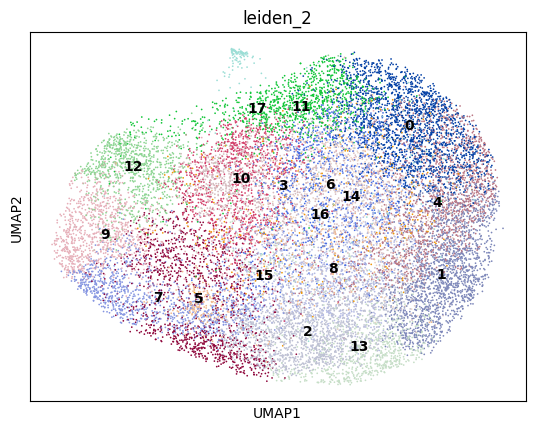

In [ ]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Save filtered cells

In [ ]:
out_type = format_cell_type(cell_type)
out_file = 'output/diha_filtered_celltypist_L3_{ot}_{d}.h5ad'.format(ot = out_type, d = date.today())
adata.write_h5ad(out_file)
out_files.append(out_file)

# Reassignment/Integration

## Integrate GZMB+ Vd2 gdT

### Proposed updates

- Integrate GZMB+ Vd2 gdT from Naive Vd1 gdT
- Remove HBB+ cells as erythrocyte doublet

In [ ]:
cell_type = 'GZMB+ Vd2 gdT'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [ ]:
type_uuid

'427f1a02-2ada-4da0-80e3-be3831df9ed3'

In [ ]:
adata = read_adata_uuid(type_uuid)
total_cells = adata.shape[0]

In [ ]:
adata.obs['predicted_AIFI_L3'] = adata.obs['AIFI_L3']

### Clustering

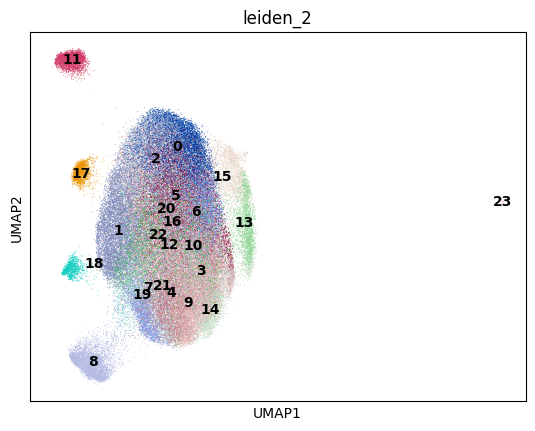

In [ ]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

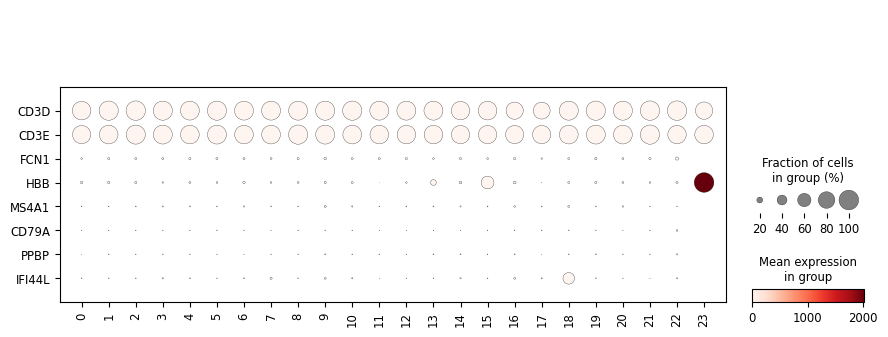

In [ ]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

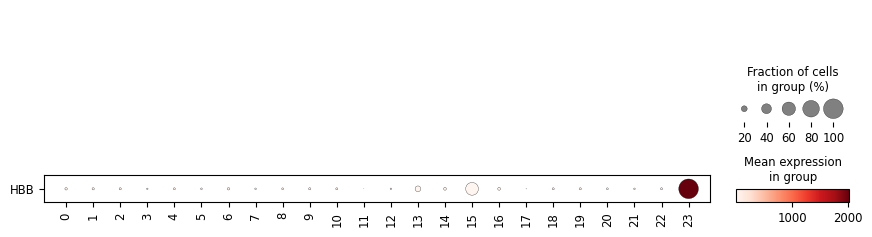

In [ ]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = ['HBB'], swap_axes = True)

### HBB Filtering

In [ ]:
adata, n_removed = remove_cl(
    adata, 'HBB', 'above', 0.6, 'leiden_2'
)
n_removed

['23']


13

### HBB Reason

In [ ]:
update_df = pd.DataFrame(
    {'AIFI_L3': [cell_type],
     'update_type': ['remove'],
     'n_total': [total_cells],
     'n_updated': [n_removed],
     'change_to': ['Erythrocyte doublet']
    }
)
update_list.append(update_df)

### Combine cells from filtered groups

In [ ]:
adata = sc.concat([adata, klrf1_vd2_adata])

### Reprocess filtered and combined cells

In [ ]:
adata = process_adata(adata, resolution = 2)
adata = propagate_hierarchy(adata, hierarchy_df)

Normalizing; Finding HVGs; Scaling; PCA; Neighbors; Leiden; UMAP; Renormalizing


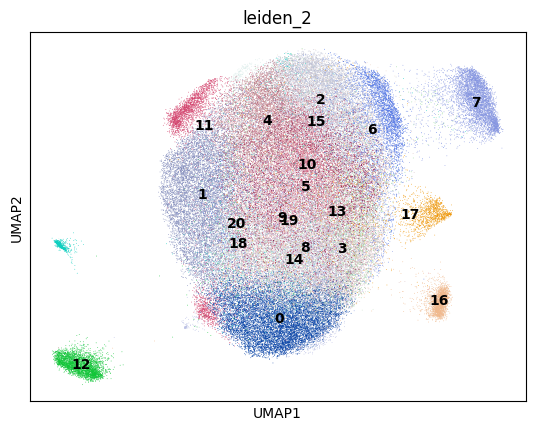

In [ ]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

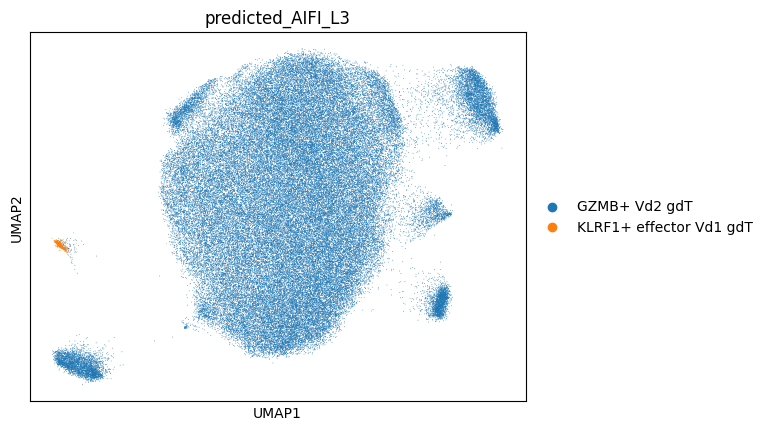

In [ ]:
sc.pl.umap(adata, color = 'predicted_AIFI_L3')

### Save filtered cells

In [ ]:
out_type = format_cell_type(cell_type)
out_file = 'output/diha_filtered_celltypist_L3_{ot}_{d}.h5ad'.format(ot = out_type, d = date.today())
adata.write_h5ad(out_file)
out_files.append(out_file)

## Integrate GZMK+ memory CD4 Treg

### Proposed updates

Integrate GZMK+ cells from KLRB1+ memory CD4 Treg

In [ ]:
cell_type = 'GZMK+ memory CD4 Treg'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [ ]:
type_uuid

'08d67bd2-261d-40a6-8f5f-f89b258e5d1d'

In [ ]:
adata = read_adata_uuid(type_uuid)
total_cells = adata.shape[0]

In [ ]:
adata.obs['predicted_AIFI_L3'] = adata.obs['AIFI_L3']

### Clustering

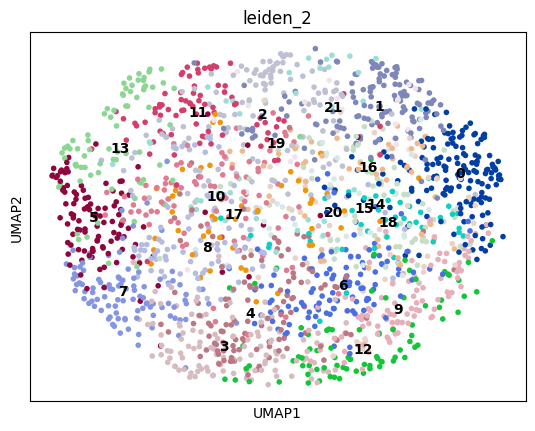

In [ ]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Combine cells from filtered groups

In [ ]:
adata = sc.concat([adata, klrb1_gzmk_adata])

### Reprocess filtered and combined cells

In [ ]:
adata = process_adata(adata, resolution = 2)
adata = propagate_hierarchy(adata, hierarchy_df)

Normalizing; Finding HVGs; Scaling; PCA; Neighbors; Leiden; UMAP; Renormalizing


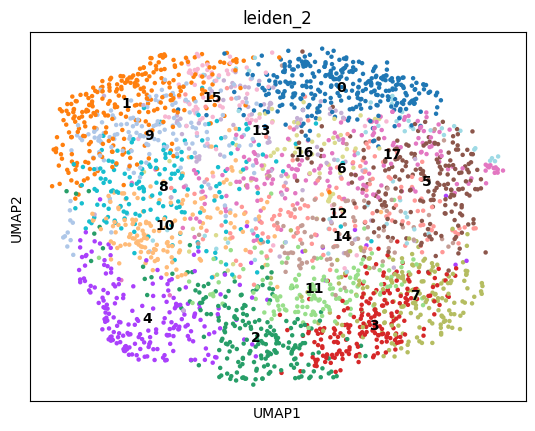

In [ ]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

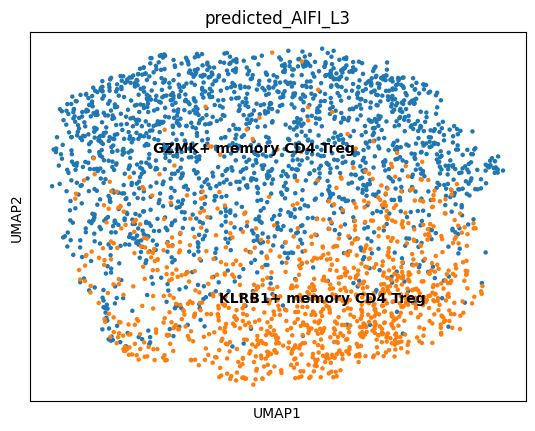

In [ ]:
sc.pl.umap(adata, color = 'predicted_AIFI_L3', legend_loc = 'on data')

### Save filtered cells

In [ ]:
out_type = format_cell_type(cell_type)
out_file = 'output/diha_filtered_celltypist_L3_{ot}_{d}.h5ad'.format(ot = out_type, d = date.today())
adata.write_h5ad(out_file)
out_files.append(out_file)

## Review Proliferating T cell

### Proposed updates

- Remove CD3D- clusters (22 and 27) as Non-T
- Integrate proliferating Tregs

In [ ]:
cell_type = 'Proliferating T cell'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [ ]:
type_uuid

'68f264fe-e653-4257-b65d-d5e33a4754bb'

In [ ]:
adata = read_adata_uuid(type_uuid)
total_cells = adata.shape[0]

In [ ]:
adata.obs['predicted_AIFI_L3'] = adata.obs['AIFI_L3']

### Clustering

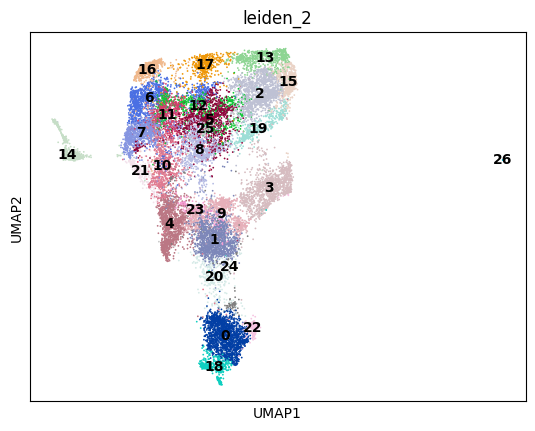

In [ ]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

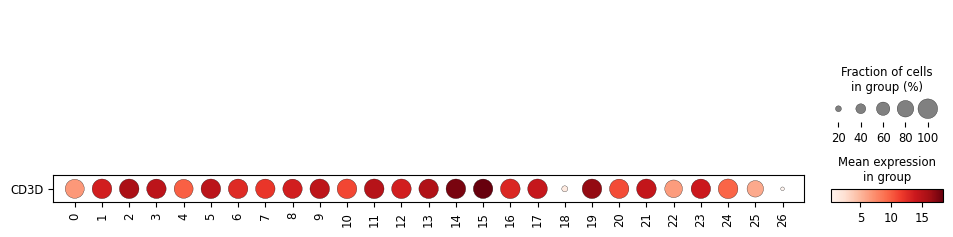

In [ ]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = ['CD3D'], swap_axes = True)

### CD3D- Selection

In [ ]:
cd3d_neg_cl = select_clusters_below_gene_frac(
    adata, 'CD3D', 0.6, 'leiden_2'
)
cd3d_neg_cl

['18', '26']

In [ ]:
sel_adata = adata[adata.obs['leiden_2'].isin(cd3d_neg_cl)]
sel_adata.shape

(475, 33538)

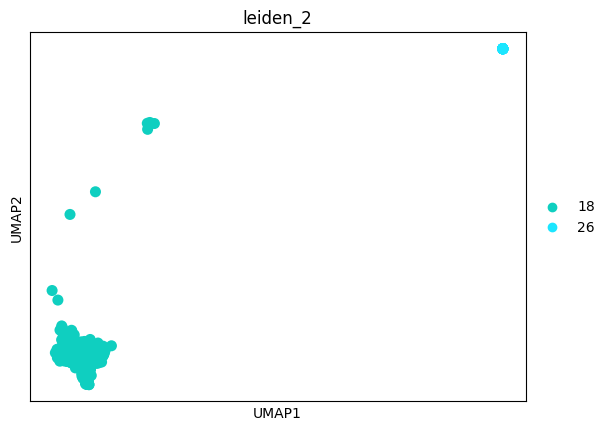

In [ ]:
sc.pl.umap(sel_adata, color = 'leiden_2')

### CD3D- Filtering

In [ ]:
filter_idx = [not x for x in adata.obs['leiden_2'].isin(cd3d_neg_cl)]
adata = adata[filter_idx]

### CD3D- Reason

In [ ]:
update_df = pd.DataFrame(
    {'AIFI_L3': [cell_type],
     'update_type': ['remove'],
     'n_total': [total_cells],
     'n_updated': [sel_adata.shape[0]],
     'change_to': ['Mislabeled CD3D-']
    }
)
update_list.append(update_df)

### Combine cells from filtered groups

In [ ]:
adata = sc.concat([adata, cd4_mem_prolif_adata])

### Reprocess filtered and combined cells

In [ ]:
adata = process_adata(adata, resolution = 2)
adata = propagate_hierarchy(adata, hierarchy_df)

Normalizing; Finding HVGs; Scaling; PCA; Neighbors; Leiden; UMAP; Renormalizing


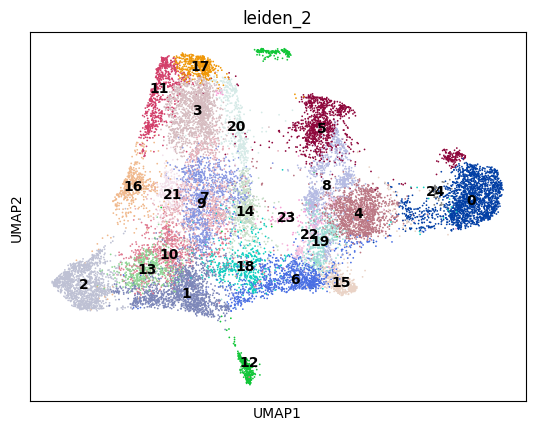

In [ ]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

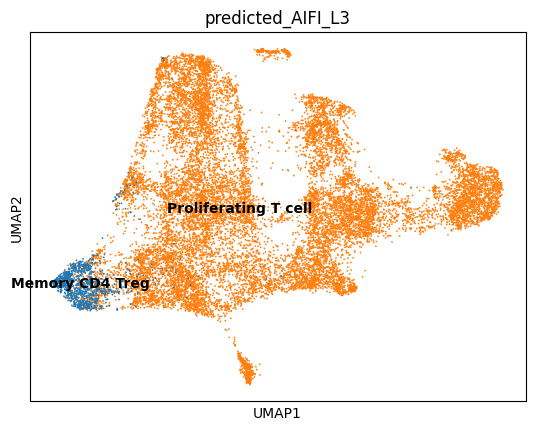

In [ ]:
sc.pl.umap(adata, color = 'predicted_AIFI_L3', legend_loc = 'on data')

### Save filtered cells

In [ ]:
out_type = format_cell_type(cell_type)
out_file = 'output/diha_filtered_celltypist_L3_{ot}_{d}.h5ad'.format(ot = out_type, d = date.today())
adata.write_h5ad(out_file)
out_files.append(out_file)

# No Updates

## Pass-through ISG+ MAIT

### Proposed updates

No proposed changes

In [ ]:
cell_type = 'ISG+ MAIT'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [ ]:
type_uuid

'be52d937-6d53-4ca3-88f3-5741130bb389'

In [ ]:
adata = read_adata_uuid(type_uuid)
adata.obs['predicted_AIFI_L3'] = adata.obs['AIFI_L3']
adata = propagate_hierarchy(adata, hierarchy_df)

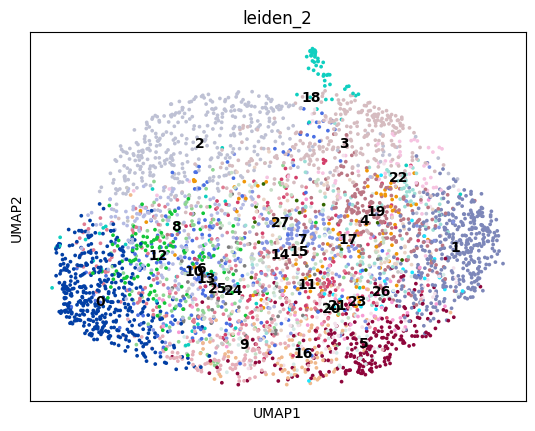

In [ ]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

In [ ]:
out_type = format_cell_type(cell_type)
out_file = 'output/diha_filtered_celltypist_L3_{ot}_{d}.h5ad'.format(ot = out_type, d = date.today())
adata.write_h5ad(out_file)
out_files.append(out_file)

## Pass-through Memory CD8 Treg

### Proposed updates

- Reassign KLRB1+ cluster (3) as KLRB1+ memory CD4 Treg
    - Did not integrate. Will pass-through this cell type

In [ ]:
cell_type = 'Memory CD8 Treg'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [ ]:
type_uuid

'bc8acf20-7748-4107-9912-c3fcfe8929a3'

In [ ]:
adata = read_adata_uuid(type_uuid)
adata.obs['predicted_AIFI_L3'] = adata.obs['AIFI_L3']
adata = propagate_hierarchy(adata, hierarchy_df)

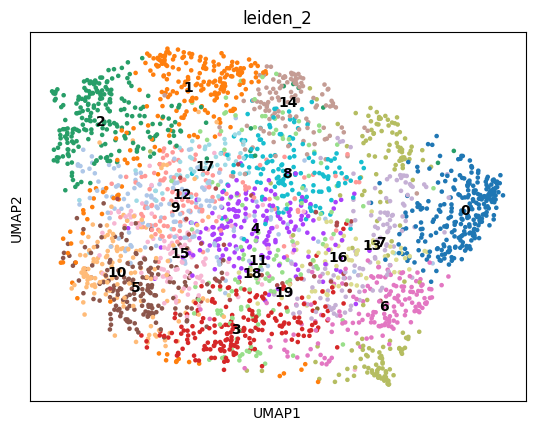

In [ ]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

In [ ]:
out_type = format_cell_type(cell_type)
out_file = 'output/diha_filtered_celltypist_L3_{ot}_{d}.h5ad'.format(ot = out_type, d = date.today())
adata.write_h5ad(out_file)
out_files.append(out_file)

## Assemble update reasoning

In [ ]:
update_df = pd.concat(update_list)

In [269]:
update_df

,AIFI_L3,update_type,n_total,n_updated,change_to
0,CD4 MAIT,reassign,13210,6206,Doublets
0,CD8 MAIT,remove,349680,3346,Mislabeled GZMH+
0,Memory CD4 Treg,reassign,143652,1026,Proliferating T cell
0,DN T cell,remove,16792,42,B cell Doublet
0,KLRF1- effector Vd1 gdT,remove,26280,2308,Mislabeled TRDC-
0,KLRF1- effector Vd1 gdT,remove,26280,226,abT/gdT doublet
0,KLRF1+ effector Vd1 gdT,remove,39060,433,abT/gdT Doublet
0,KLRF1+ effector Vd1 gdT,reassign,39060,650,GZMB+ Vd2 gdT
0,Naive CD4 Treg,reassign,39060,951,Mislabeled GZMK+
0,Naive CD4 Treg,reassign,39060,184,Mislabeled GZMB+


In [ ]:
out_update = 'output/diha_filtered_celltypist_L3_other_t_reasons_{d}.csv'.format(d = date.today())
update_df.to_csv(out_update)
out_files.append(out_update)

## Upload Cell Type data to HISE

Finally, we'll use `hisepy.upload.upload_files()` to send a copy of our output to HISE to use for downstream analysis steps.

In [270]:
study_space_uuid = 'de025812-5e73-4b3c-9c3b-6d0eac412f2a'
title = 'DIHA CellTypist L3 Other T Filtered {d}'.format(d = date.today())

In [271]:
search_id = element_id()
search_id

'magnesium-potassium-zinc'

In [272]:
in_files = search_df['id'].tolist()
in_files = in_files + [hierarchy_uuid]

In [273]:
out_files

['output/diha_filtered_celltypist_L3_CD4_MAIT_2024-04-23.h5ad',
 'output/diha_filtered_celltypist_L3_CD8_MAIT_2024-04-23.h5ad',
 'output/diha_filtered_celltypist_L3_Memory_CD4_Treg_2024-04-23.h5ad',
 'output/diha_filtered_celltypist_L3_DN_T_cell_2024-04-23.h5ad',
 'output/diha_filtered_celltypist_L3_KLRF1neg_effector_Vd1_gdT_2024-04-23.h5ad',
 'output/diha_filtered_celltypist_L3_KLRF1pos_effector_Vd1_gdT_2024-04-23.h5ad',
 'output/diha_filtered_celltypist_L3_Naive_CD4_Treg_2024-04-23.h5ad',
 'output/diha_filtered_celltypist_L3_Naive_Vd1_gdT_2024-04-23.h5ad',
 'output/diha_filtered_celltypist_L3_SOX4pos_Vd1_gdT_2024-04-23.h5ad',
 'output/diha_filtered_celltypist_L3_GZMKpos_Vd2_gdT_2024-04-23.h5ad',
 'output/diha_filtered_celltypist_L3_KLRB1pos_memory_CD8_Treg_2024-04-23.h5ad',
 'output/diha_filtered_celltypist_L3_KLRB1pos_memory_CD4_Treg_2024-04-23.h5ad',
 'output/diha_filtered_celltypist_L3_GZMBpos_Vd2_gdT_2024-04-23.h5ad',
 'output/diha_filtered_celltypist_L3_GZMKpos_memory_CD4_Treg_2

In [274]:
hisepy.upload.upload_files(
    files = out_files,
    study_space_id = study_space_uuid,
    title = title,
    input_file_ids = in_files,
    destination = search_id
)

you are trying to upload file_ids... ['output/diha_filtered_celltypist_L3_CD4_MAIT_2024-04-23.h5ad', 'output/diha_filtered_celltypist_L3_CD8_MAIT_2024-04-23.h5ad', 'output/diha_filtered_celltypist_L3_Memory_CD4_Treg_2024-04-23.h5ad', 'output/diha_filtered_celltypist_L3_DN_T_cell_2024-04-23.h5ad', 'output/diha_filtered_celltypist_L3_KLRF1neg_effector_Vd1_gdT_2024-04-23.h5ad', 'output/diha_filtered_celltypist_L3_KLRF1pos_effector_Vd1_gdT_2024-04-23.h5ad', 'output/diha_filtered_celltypist_L3_Naive_CD4_Treg_2024-04-23.h5ad', 'output/diha_filtered_celltypist_L3_Naive_Vd1_gdT_2024-04-23.h5ad', 'output/diha_filtered_celltypist_L3_SOX4pos_Vd1_gdT_2024-04-23.h5ad', 'output/diha_filtered_celltypist_L3_GZMKpos_Vd2_gdT_2024-04-23.h5ad', 'output/diha_filtered_celltypist_L3_KLRB1pos_memory_CD8_Treg_2024-04-23.h5ad', 'output/diha_filtered_celltypist_L3_KLRB1pos_memory_CD4_Treg_2024-04-23.h5ad', 'output/diha_filtered_celltypist_L3_GZMBpos_Vd2_gdT_2024-04-23.h5ad', 'output/diha_filtered_celltypist_L3_G

(y/n) y


{'trace_id': '4096dd6d-0268-4bf4-87d3-21c9e7ebb42f',
 'files': ['output/diha_filtered_celltypist_L3_CD4_MAIT_2024-04-23.h5ad',
  'output/diha_filtered_celltypist_L3_CD8_MAIT_2024-04-23.h5ad',
  'output/diha_filtered_celltypist_L3_Memory_CD4_Treg_2024-04-23.h5ad',
  'output/diha_filtered_celltypist_L3_DN_T_cell_2024-04-23.h5ad',
  'output/diha_filtered_celltypist_L3_KLRF1neg_effector_Vd1_gdT_2024-04-23.h5ad',
  'output/diha_filtered_celltypist_L3_KLRF1pos_effector_Vd1_gdT_2024-04-23.h5ad',
  'output/diha_filtered_celltypist_L3_Naive_CD4_Treg_2024-04-23.h5ad',
  'output/diha_filtered_celltypist_L3_Naive_Vd1_gdT_2024-04-23.h5ad',
  'output/diha_filtered_celltypist_L3_SOX4pos_Vd1_gdT_2024-04-23.h5ad',
  'output/diha_filtered_celltypist_L3_GZMKpos_Vd2_gdT_2024-04-23.h5ad',
  'output/diha_filtered_celltypist_L3_KLRB1pos_memory_CD8_Treg_2024-04-23.h5ad',
  'output/diha_filtered_celltypist_L3_KLRB1pos_memory_CD4_Treg_2024-04-23.h5ad',
  'output/diha_filtered_celltypist_L3_GZMBpos_Vd2_gdT_2024-

In [275]:
import session_info
session_info.show()